# Exective summary of Work Package 1

## Objectives

This work package aims at developing methods for cleaning and preprocessing the data, and select the most relevant features for further model development.

## Tasks

- Task 1: Read and understand the data
  - Understand how to use the provided utility function to read the data
  - Understand the data structure and the meaning of each column
- Task 2: Clean and preprocess the data
  - Explore the quality of the data
  - Develop methods to remove the outlier and clean the data
- Task 3: Feature engineering
  - Visualize the data
  - Develop methods to select the most relevant features

## Delierables

- A Jupyter notebook reporting the process and results of the above tasks


# Before starting, please:
- Fetch the most up-to-date version of the github repository.
- Create a new branch called "WP2_TD_Lect_5_YourName", based on the branch "zhiguo_dev" and switch to it.
- Copy the notebook WP2_DATA-DRIVEN FAULT DETECTION/support/WP2_TD_Lect_5 to WP2_DATA-DRIVEN FAULT DETECTION/TD_5/, and rename it to TD_Lect_5_YourName.ipynb
- After finishing this task, push your changes to your github repository.
- Submit a pull request to the "zhiguo_dev" branch.

# Task 1 Read and understand the data

## Sub-task 1: Read the data from the different csv files and store it in a dataframe. 

The training data is stored in the following path: `projects\maintenance_industry_4_2024\dataset\training_data`. In this folder, there are some subfolders. Each subfolder contains the data of one test. The name of the subfolder tells you the time when the test is performed. Inside each subfolder, there are six csv files, each file corresponds to the data from one motor. The file `Test condition.xlsx` tells you the test condition for each test.

In `utility.py`, there are supporting functions `read_all_csvs_one_test` and `read_all_test_data_from_path`. Please have a look at the demo in `demo_read_data_and_preprocess.ipynb`, and use these supporting functions to read the data.


**Your task:**

- Create a dataframe to store data from all the test.
- Write a paragraph to explain the structure of the resulted dataframe (what does each column represent?)

Libraries

In [2]:
from utility import read_all_test_data_from_path
from utility import read_all_csvs_one_test
import pandas as pd
import numpy as np
import os
import warnings
import matplotlib.pyplot as plt
import seaborn as sns
import pca
from sklearn.preprocessing import StandardScaler
from sklearn.preprocessing import MinMaxScaler
from sklearn.decomposition import PCA
from sklearn.model_selection import train_test_split
from sklearn.ensemble import RandomForestClassifier
from sklearn.metrics import f1_score,confusion_matrix, roc_curve, auc
from sklearn.metrics import accuracy_score, classification_report
from sklearn.feature_selection import SelectKBest
from sklearn.feature_selection import chi2

Create a dataframe to store data from all the test.

20240105_164214: 0    Robot not moving, just starting up.
Name: Description, dtype: object

20240105_165300: 1    Not moving. Then perform a pick-up and place o...
Name: Description, dtype: object

20240105_165972: 2    Not moving. After the operation.
Name: Description, dtype: object

20240320_152031: 3    Robot not moving, just starting up.
Name: Description, dtype: object

20240320_153841: 4    Not moving. Move motor 6 -> motor 1 sequentially.
Name: Description, dtype: object

20240320_155664: 5    Robot not moving.
Name: Description, dtype: object

20240321_122650: 6    Try to move to pick up an item from second flo...
Name: Description, dtype: object

20240325_135213: 7    Robot not moving, just starting up.
Name: Description, dtype: object

20240325_152902: 8    Not moving. Then perform a pick-up and place o...
Name: Description, dtype: object

20240325_155003: 9    Starting position: Straigt. Perform two operat...
Name: Description, dtype: object



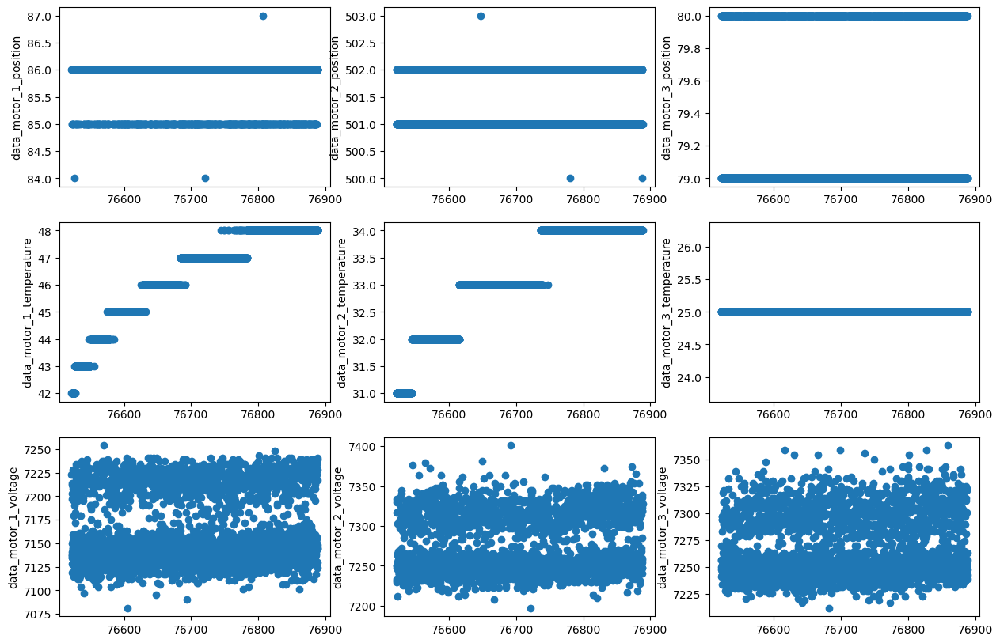

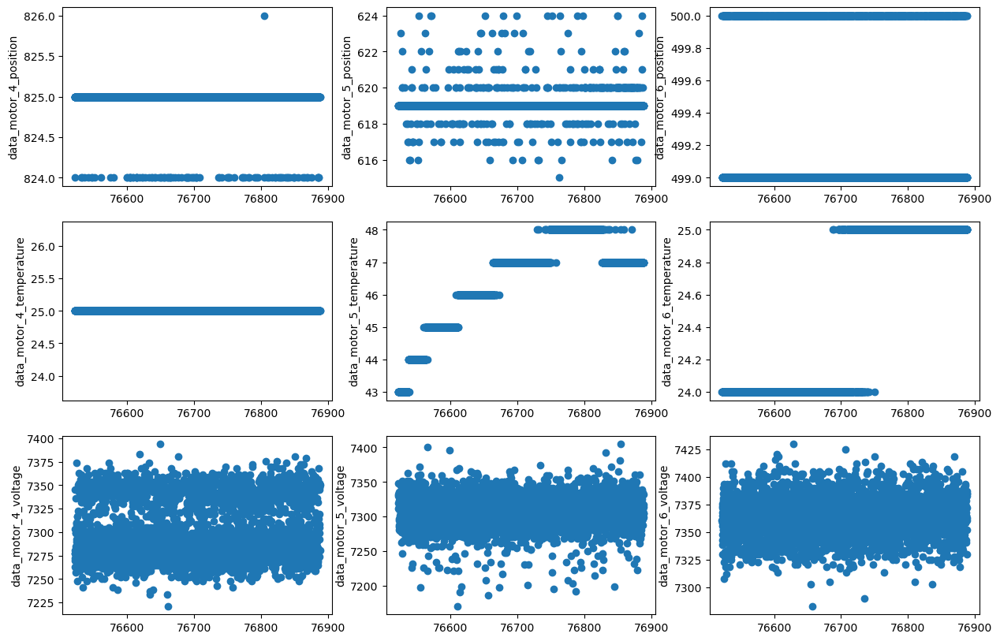

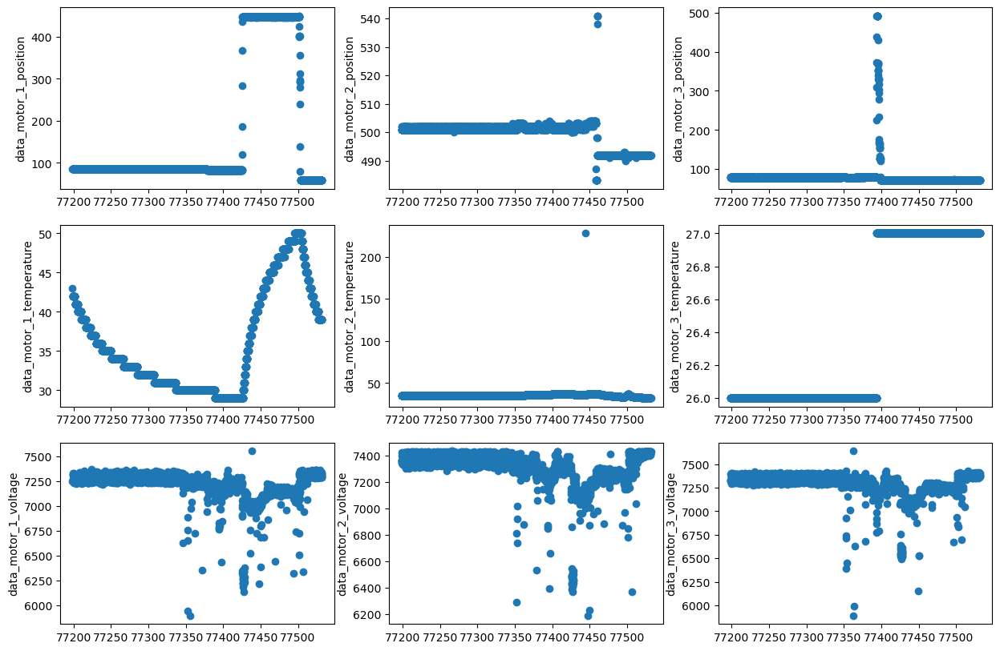

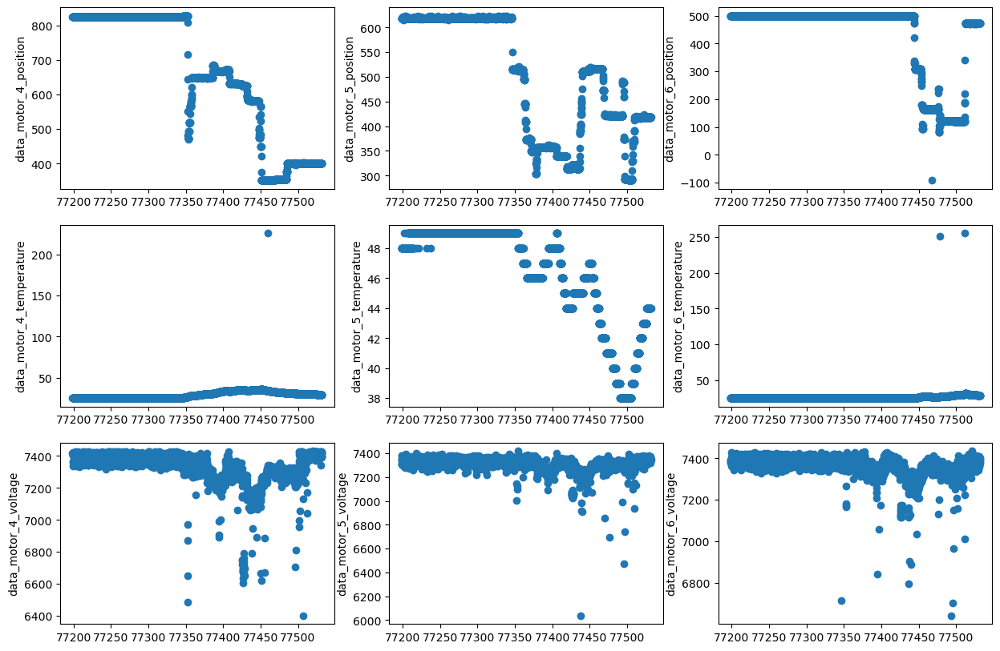

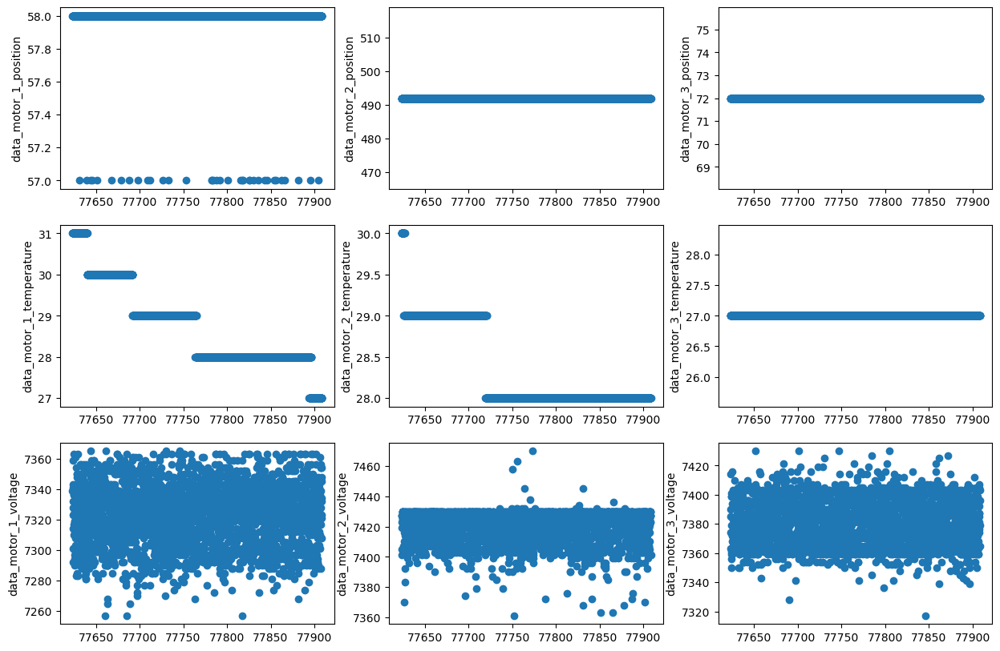

...

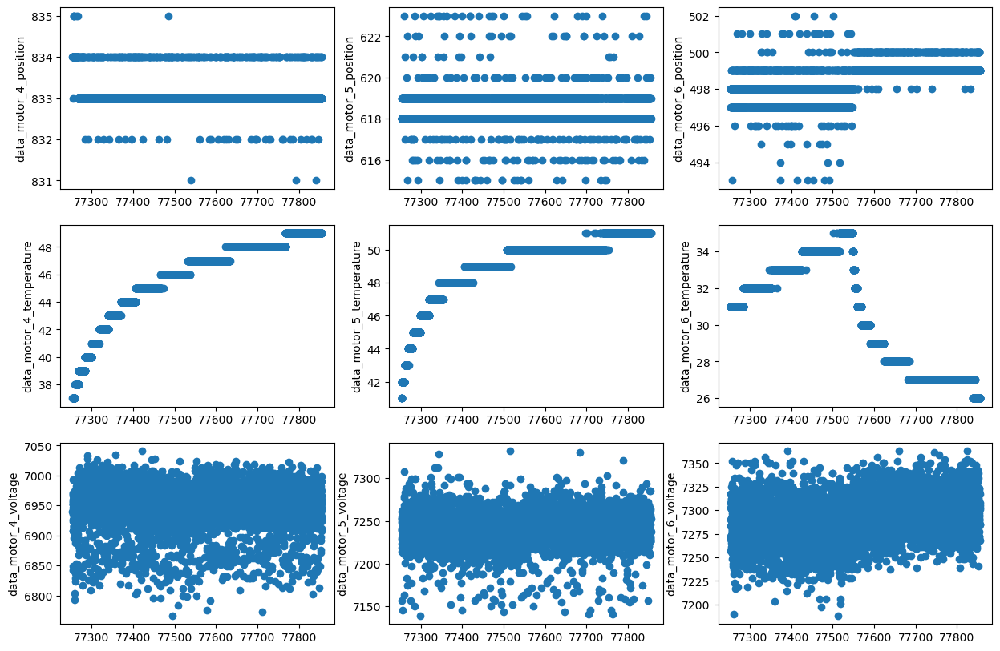

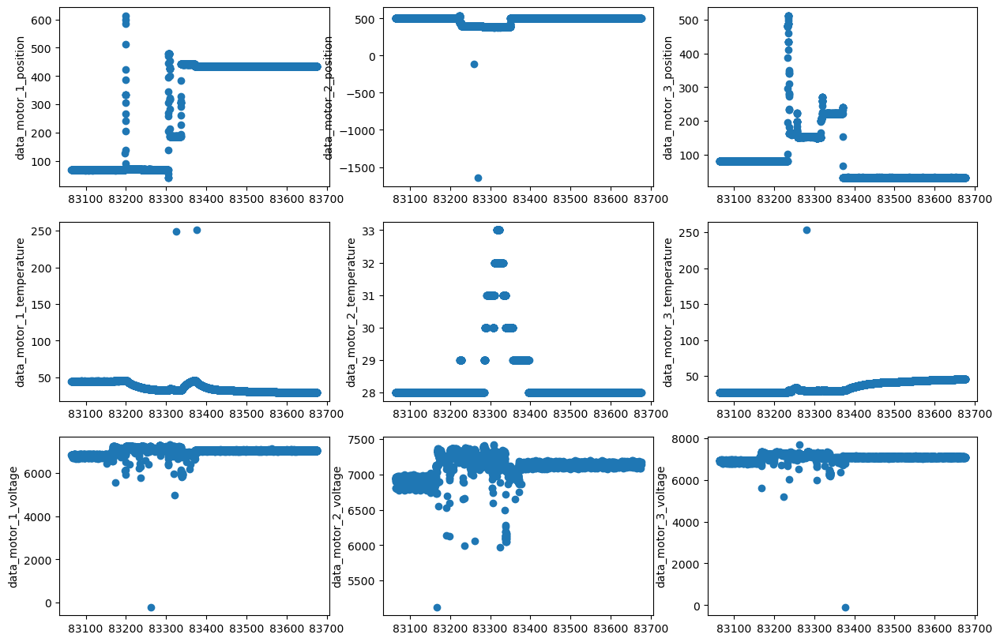

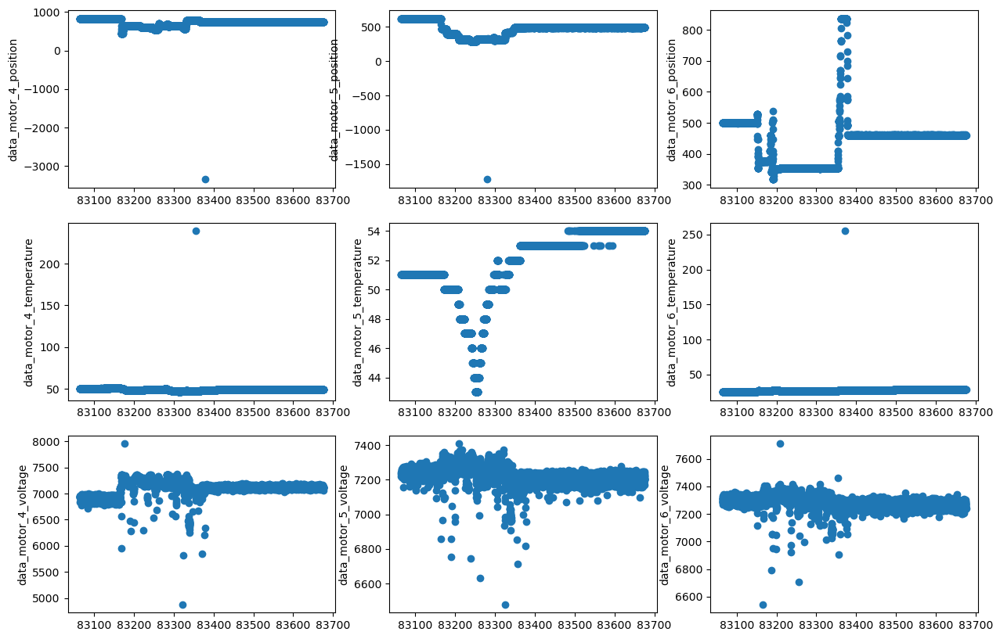

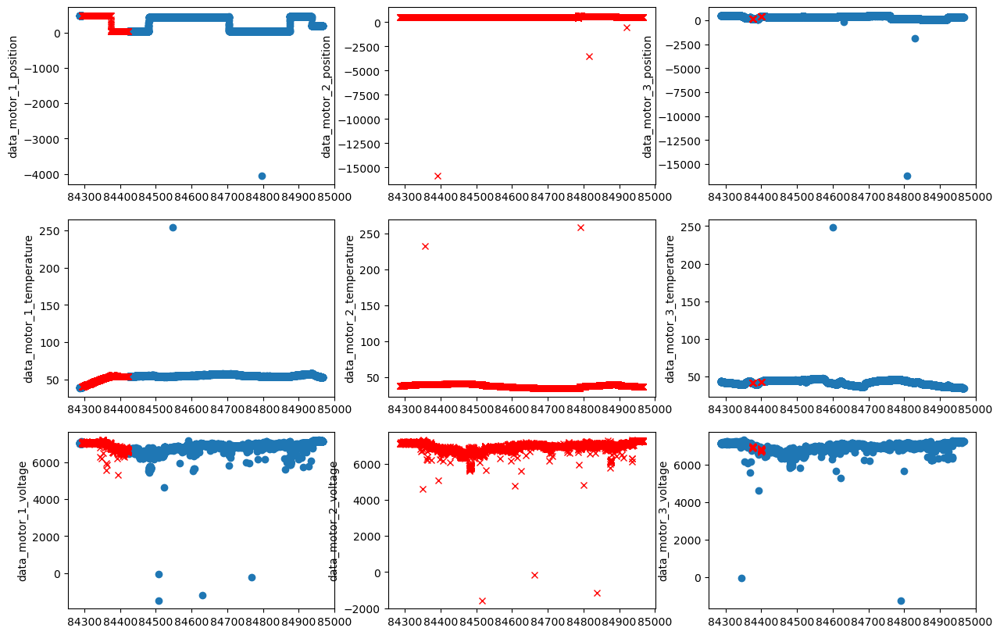

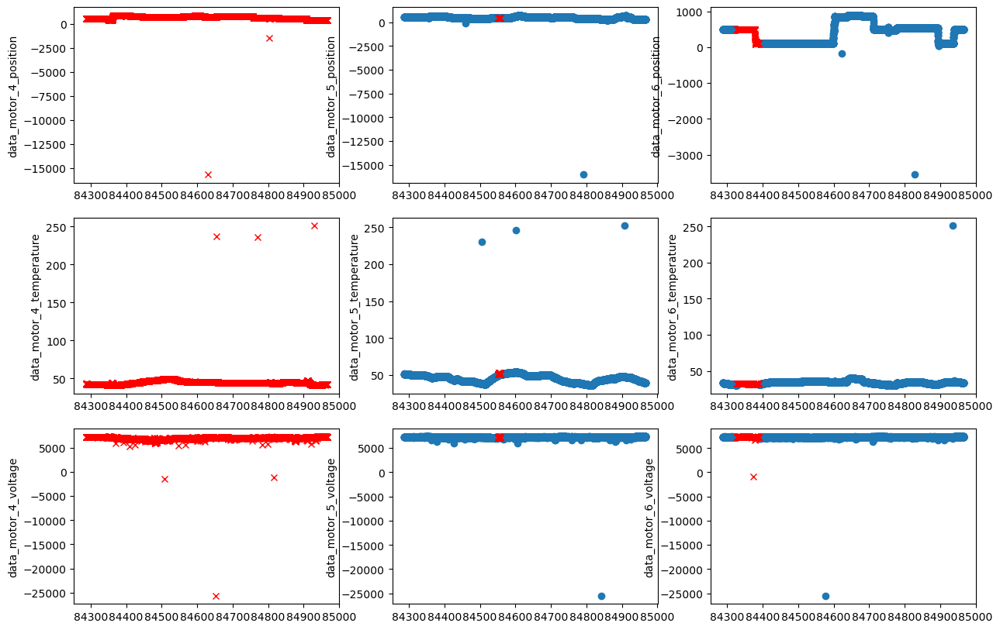

In [3]:
# Specify path to the dictionary.
base_dictionary = '../../dataset/training_data/'

# Read the data.
df_data = read_all_test_data_from_path(base_dictionary)

Please explain the structure (what does each column represent) of the resulted dataframe here.

The resulted dataframe represent the position, temperature and voltage for each of the 6 motors, as a function of time, and the label represents whether we failures (1 : red ) or normal data ( 0 : blue). Then the columns repeat these 4 pieces of information for each motor and the last column specifies the test condition.

In [4]:
df_data.head()

,time,data_motor_1_position,data_motor_1_temperature,data_motor_1_voltage,data_motor_1_label,data_motor_2_position,data_motor_2_temperature,data_motor_2_voltage,data_motor_2_label,data_motor_3_position,...,data_motor_4_label,data_motor_5_position,data_motor_5_temperature,data_motor_5_voltage,data_motor_5_label,data_motor_6_position,data_motor_6_temperature,data_motor_6_voltage,data_motor_6_label,test_condition
0,76522.025433,86,42,7223,0,501,31,7334,0,80,...,0,619,43,7312,0,500,24,7361,0,20240105_164214
1,76522.125464,86,42,7214,0,502,31,7250,0,80,...,0,619,43,7332,0,499,24,7372,0,20240105_164214
2,76522.225432,86,42,7137,0,501,31,7234,0,79,...,0,619,43,7330,0,499,24,7356,0,20240105_164214
3,76522.325432,86,42,7135,0,501,31,7250,0,79,...,0,619,43,7319,0,499,24,7374,0,20240105_164214
4,76522.425451,86,42,7212,0,502,31,7232,0,79,...,0,619,43,7348,0,499,24,7365,0,20240105_164214


## Sub-task 2: Data visualization

Visualize the data. By examing the data, you can answer the following questions:
- Do we have a lot noise in the features? Do we need to smooth the data?
- Do we need to scale the features?
- Do we have a lot of outliers? Do we need to remove them?
- Do we have a lot of missing values? Do we need to fill them?
- In general, do you discover some patterns regarding how temperature of the motor changes?
- If we compare the normal data (label = 0) with the failures (label=1), could you see some difference in the pattern of the temperature?

**Submit your summary below:**

- Noise : The duplicated horizontal lines in the position graphs represent noise in the dataset. Nonetheless, there is a lot of noise in the voltage dataframes. We need to smooth the data for the Voltage dataframe.

- Scaling : The need to scale the features comes with the choice of the machine learning model implemented, for example voltage is on a much larger scale, and if we choose models such as SVM or neural networks, voltage will have a much greater importance for the classifier than the other features due to its scale. However, these problems do not occur with models such as decision trees. We chose to normalize the features because they don't have bell curves, which means that standardization may not work so well

- Outliers : Some outliers in the voltage dataframes. Since we use normalization to treat the data, which is very sensitive to outliers, we should remove them. Furthermore, the analysis with the loss of data as a function of alpha in the IQR method makes it clear that we should not remove outliers that correspond to a good percentage of the dataset, as we would lose important information like this

- No missing values

- Patterns of the temperature: 

Test 0 : The temperature of motors 1, 2, 5, and 6 increases. The temperatures of motors 3 and 4 remain constant.

Test 1 : The temperature of motors 1 and 3 increases. The temperatures of motors 2,4 and 6 remain constant. The temperature of motor 5 decreases

Test 2 : The temperature of motors 5 increases. The temperature of motor 3 remain constant. The temperature of motors 1,2,3,4 and 6 decreases

Test 3 :  The temperatures of all motors remain constant

Test 4 : The temperature of motors 1 and 3 increases together. The temperatures of motors 2 and 5 remain constant. 

Test 5 : The temperatures of all motors remain constant

Test 6 : The temperature of motors 4 and 6 increases.The temperature of motor 5 decreases

Test 7 : The temperature of motors 4 and 5 increases together.The temperature of motor 6 decreases

Test 8 : The temperature of motor 2 increases while that of motor 5 decreases simultaneously

Test 9 : The temperatures of all motors remain constant

- Comparing normal data with the failures in the pattern of temperature:  It is not possible to infer a difference in the temperature pattern from the normal data and the fault data, as the temperatures remain constant in the last test regardless of the label.

In [5]:
df_data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 31135 entries, 0 to 31134
Data columns (total 26 columns):
 #   Column                    Non-Null Count  Dtype  
---  ------                    --------------  -----  
 0   time                      31135 non-null  float64
 1   data_motor_1_position     31135 non-null  int64  
 2   data_motor_1_temperature  31135 non-null  int64  
 3   data_motor_1_voltage      31135 non-null  int64  
 4   data_motor_1_label        31135 non-null  int64  
 5   data_motor_2_position     31135 non-null  int64  
 6   data_motor_2_temperature  31135 non-null  int64  
 7   data_motor_2_voltage      31135 non-null  int64  
 8   data_motor_2_label        31135 non-null  int64  
 9   data_motor_3_position     31135 non-null  int64  
 10  data_motor_3_temperature  31135 non-null  int64  
 11  data_motor_3_voltage      31135 non-null  int64  
 12  data_motor_3_label        31135 non-null  int64  
 13  data_motor_4_position     31135 non-null  int64  
 14  data_m

In [6]:
df_data.describe()

,time,data_motor_1_position,data_motor_1_temperature,data_motor_1_voltage,data_motor_1_label,data_motor_2_position,data_motor_2_temperature,data_motor_2_voltage,data_motor_2_label,data_motor_3_position,...,data_motor_4_voltage,data_motor_4_label,data_motor_5_position,data_motor_5_temperature,data_motor_5_voltage,data_motor_5_label,data_motor_6_position,data_motor_6_temperature,data_motor_6_voltage,data_motor_6_label
count,31135.000000,31135.000000,31135.000000,31135.000000,31135.000000,31135.000000,31135.000000,31135.000000,31135.000000,31135.000000,...,31135.000000,31135.000000,31135.000000,31135.00000,31135.000000,31135.000000,31135.000000,31135.000000,31135.000000,31135.000000
mean,80141.374898,179.055436,42.888614,7011.690413,0.041497,499.383491,32.084021,7117.306729,0.213650,146.937466,...,7129.718741,0.213650,522.873422,47.74572,7257.833788,0.002248,444.334672,28.998651,7305.379509,0.019881
std,3283.277642,174.029043,9.239940,243.136244,0.199439,101.648912,4.943349,230.867349,0.409889,162.818409,...,283.222422,0.409889,153.230674,4.62357,201.510067,0.047363,157.961084,4.436051,210.357164,0.139594
min,76522.025433,-4060.000000,27.000000,-1492.000000,0.000000,-15883.000000,28.000000,-1587.000000,0.000000,-16245.000000,...,-25689.000000,0.000000,-16045.000000,36.00000,-25514.000000,0.000000,-3561.000000,24.000000,-25542.000000,0.000000
25%,77405.635319,68.000000,34.000000,6857.000000,0.000000,501.000000,28.000000,6966.000000,0.000000,79.000000,...,6968.000000,0.000000,419.000000,46.00000,7226.000000,0.000000,460.000000,26.000000,7268.000000,0.000000
50%,77789.390419,85.000000,45.000000,7041.000000,0.000000,501.000000,29.000000,7137.000000,0.000000,80.000000,...,7135.000000,0.000000,521.000000,49.00000,7252.000000,0.000000,498.000000,28.000000,7305.000000,0.000000
75%,83562.256764,433.000000,48.000000,7163.000000,0.000000,502.000000,35.000000,7265.000000,0.000000,153.000000,...,7288.000000,0.000000,619.000000,50.00000,7305.000000,0.000000,499.000000,32.000000,7359.000000,0.000000
max,84966.826470,614.000000,255.000000,7552.000000,1.000000,836.000000,258.000000,7605.000000,1.000000,528.000000,...,7955.000000,1.000000,869.000000,252.00000,7425.000000,1.000000,985.000000,255.000000,7711.000000,1.000000


In [7]:
#No missing values:
df_data.isnull().sum().sum()

# no infinity values 
pd.isna(df_data).sum().sum()

0

## Sub-task 3 Explore the distribution of each feature through histogram and box plot.

In [8]:
df_data

,time,data_motor_1_position,data_motor_1_temperature,data_motor_1_voltage,data_motor_1_label,data_motor_2_position,data_motor_2_temperature,data_motor_2_voltage,data_motor_2_label,data_motor_3_position,...,data_motor_4_label,data_motor_5_position,data_motor_5_temperature,data_motor_5_voltage,data_motor_5_label,data_motor_6_position,data_motor_6_temperature,data_motor_6_voltage,data_motor_6_label,test_condition
0,76522.025433,86,42,7223,0,501,31,7334,0,80,...,0,619,43,7312,0,500,24,7361,0,20240105_164214
1,76522.125464,86,42,7214,0,502,31,7250,0,80,...,0,619,43,7332,0,499,24,7372,0,20240105_164214
2,76522.225432,86,42,7137,0,501,31,7234,0,79,...,0,619,43,7330,0,499,24,7356,0,20240105_164214
3,76522.325432,86,42,7135,0,501,31,7250,0,79,...,0,619,43,7319,0,499,24,7374,0,20240105_164214
4,76522.425451,86,42,7212,0,502,31,7232,0,79,...,0,619,43,7348,0,499,24,7365,0,20240105_164214
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
31130,84966.426470,195,53,7161,0,482,36,7265,1,327,...,1,286,39,7317,0,494,33,7305,0,20240325_155003
31131,84966.526530,195,53,7155,0,482,36,7239,1,328,...,1,287,39,7332,0,494,33,7319,0,20240325_155003
31132,84966.626610,195,53,7155,0,482,36,7246,1,328,...,1,287,39,7268,0,495,33,7356,0,20240325_155003
31133,84966.726460,195,53,7163,0,482,36,7274,1,328,...,1,286,39,7301,0,495,33,7303,0,20240325_155003


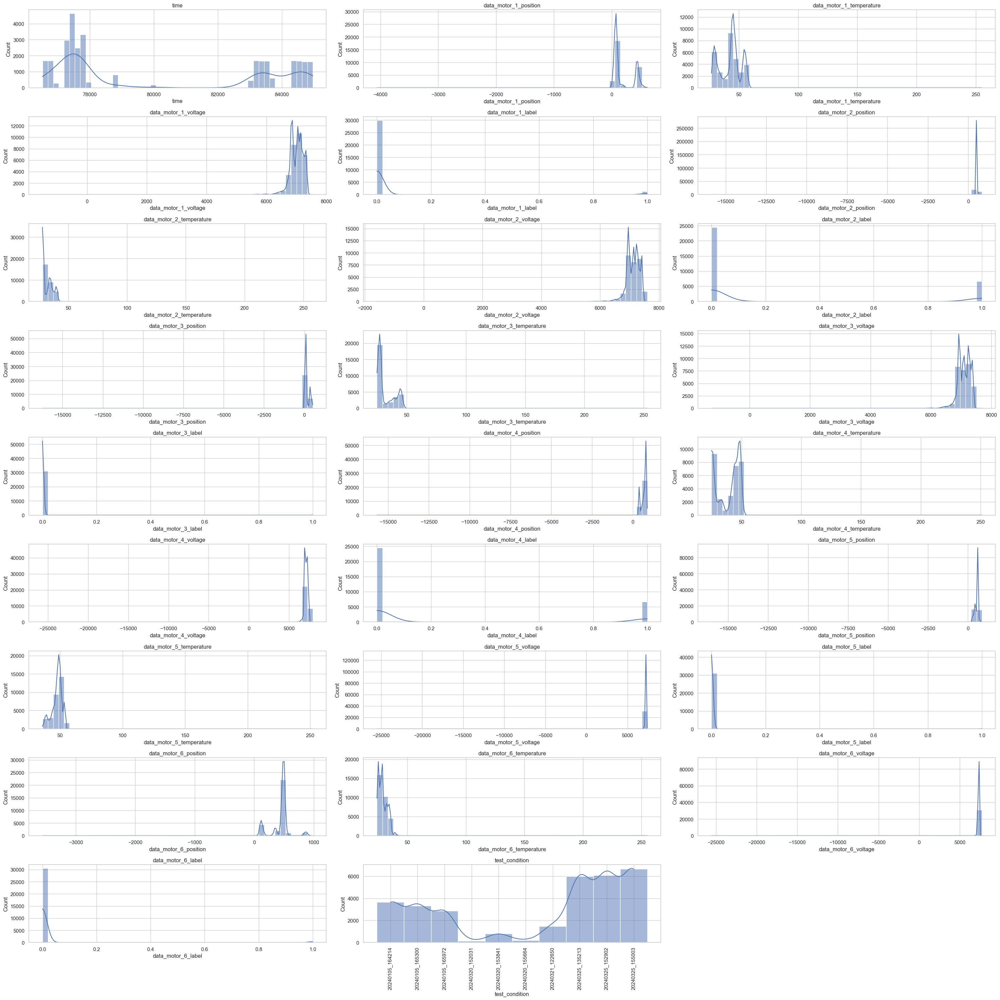

In [9]:
warnings.simplefilter(action='ignore', category=FutureWarning)

pd.set_option('mode.use_inf_as_na', True)
sns.set(style="whitegrid")

plt.figure(figsize=(30, 30))
for col in df_data.columns:
    plt.subplot(df_data.shape[1] // 3 + 1, 3, list(df_data.columns).index(col) + 1)
    sns.histplot(df_data[col], kde=True, bins=50)
    plt.title(col)
    if col == df_data.columns[-1]:  # the values on the x-axis of the last graph were overlapping
        plt.xticks(rotation=90)  
plt.tight_layout()
plt.tight_layout()
plt.show()

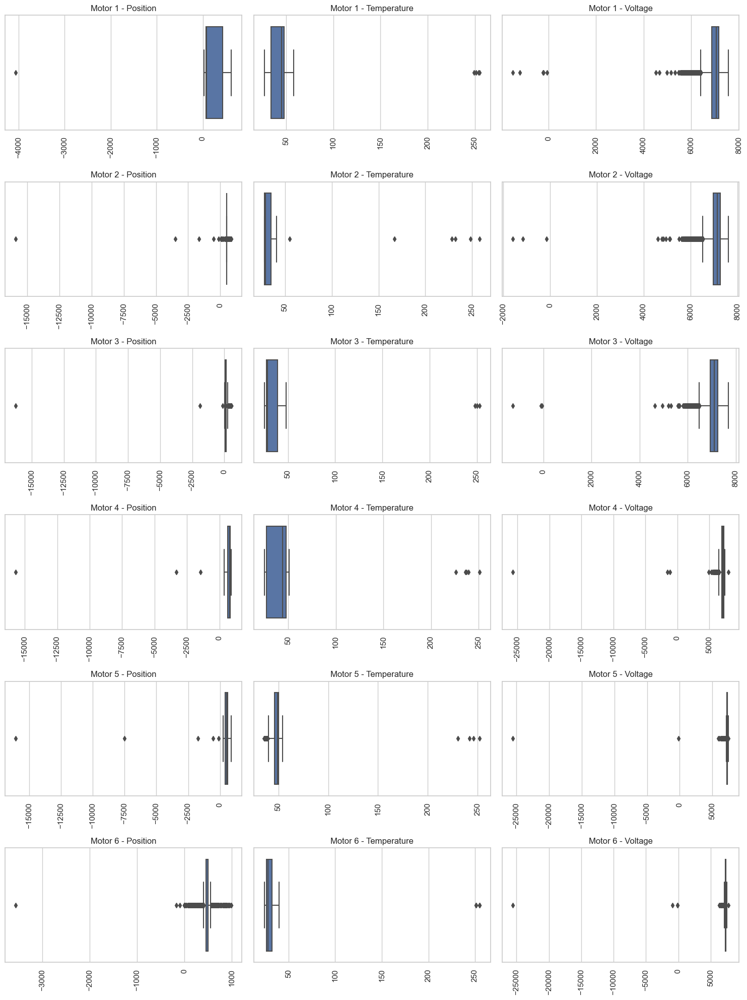

In [10]:
motor_features = ['position', 'temperature', 'voltage']

fig, axs = plt.subplots(6, 3, figsize=(15, 20))

for i in range(1, 7):
    for j, feature in enumerate(motor_features):
        data = df_data[f'data_motor_{i}_{feature}']
        sns.boxplot(x=data, ax=axs[i-1, j])
        axs[i-1, j].set_title(f'Motor {i} - {feature.capitalize()}')
        axs[i-1, j].set_xlabel('')
        axs[i-1, j].set_ylabel('')
        axs[i-1, j].tick_params(axis='x', rotation=90)

plt.tight_layout()
plt.show()

We have unbalanced data:

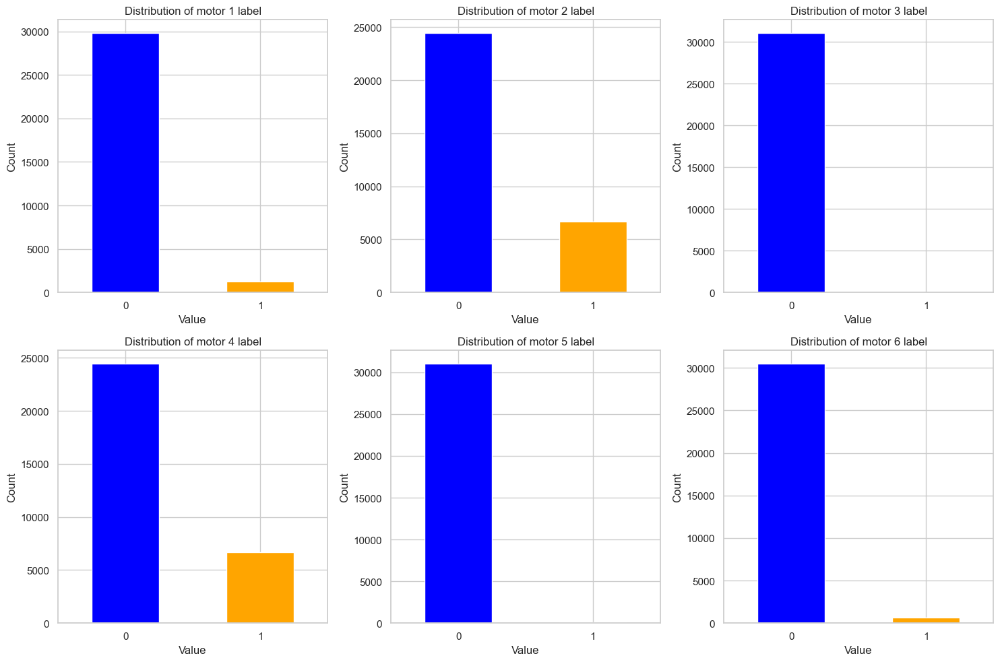

In [11]:
fig, axs = plt.subplots(2, 3, figsize=(15, 10))
for i, ax in zip(range(1, 7), axs.flat):
    df_data[f'data_motor_{i}_label'].value_counts().plot(kind='bar', color=['blue', 'orange'], ax=ax)
    ax.set_title(f'Distribution of motor {i} label')
    ax.set_xlabel('Value')
    ax.set_ylabel('Count')
    ax.tick_params(axis='x', rotation=0)

plt.tight_layout()
plt.show()

In [12]:
df_data[f'data_motor_5_label'].value_counts()

data_motor_5_label
0    31065
1       70
Name: count, dtype: int64

## Sub-task 4 Use PCA to visulize the data in a 2-d plane.

Normally, before any further analysis, we try to plot all the features directly in a 2-d plane. This is because the 2-d plane is a very simple representation of the data and allows us to visually inspect the patterns of the data. A normal conclusion we can make is whether the data are linear seperable or not, i.e., if you can simply fit a straight line to seperate postitive and negative classes. However, if the data is high-dimensional, it is difficult to visualize it in a 2-d plane. In this case, we can use PCA to reduce the dimensionality of the data and then plot it in a 2-d plane.

Below is a code for performing PCA and plotting the data in a 2-d plane. What can you see from the results?

In [13]:
label_columns = ['data_motor_1_label', 'data_motor_2_label', 'data_motor_3_label', 'data_motor_4_label', 'data_motor_5_label', 'data_motor_6_label']

df = df_data.drop(columns=['time','test_condition']) 

df_features = df.drop(columns=label_columns)

In [14]:
def plot_pca(X, data):
    # PCA 
    pca = PCA(n_components=2)
    X_pca = pca.fit_transform(X)

    #PCA with normalization
    X_train_normalized = MinMaxScaler().fit_transform(X)
    pca_normalized = PCA(n_components=2)
    X_pca_normalized = pca_normalized.fit_transform(X_train_normalized)

    # PCA with standardization
    X_train_standard = StandardScaler().fit_transform(X)
    pca_standard = PCA(n_components=2)
    X_pca_standard = pca_standard.fit_transform(X_train_standard)

    fig, axs = plt.subplots(6, 3, figsize=(18, 24))

    for i in range(1, 7):    
        # PCA 
        y = data[f'data_motor_{i}_label']  

        axs[i-1, 0].scatter(X_pca[y == 0, 0], X_pca[y == 0, 1], color='red', marker='^', alpha=.5, label='Class 0')
        axs[i-1, 0].scatter(X_pca[y == 1, 0], X_pca[y == 1, 1], color='blue', marker='o', alpha=.5, label='Class 1')
        axs[i-1, 0].set_title(f'PCA Result for label {i}')
        axs[i-1, 0].set_xlabel('Principal Component 1')
        axs[i-1, 0].set_ylabel('Principal Component 2')
        axs[i-1, 0].legend()
    
        #PCA with normalization

        axs[i-1, 1].scatter(X_pca_normalized[y == 0, 0], X_pca_normalized[y == 0, 1], color='red', marker='^', alpha=.5, label='Class 0')
        axs[i-1, 1].scatter(X_pca_normalized[y == 1, 0], X_pca_normalized[y == 1, 1], color='blue', marker='o', alpha=.5, label='Class 1')
        axs[i-1, 1].set_title(f'PCA Result with Normalization for label {i}')
        axs[i-1, 1].set_xlabel('Principal Component 1')
        axs[i-1, 1].set_ylabel('Principal Component 2')
        axs[i-1, 1].legend()

        # PCA with standardization

        axs[i-1, 2].scatter(X_pca_standard[y == 0, 0], X_pca_standard[y == 0, 1], color='red', marker='^', alpha=.5, label='Class 0')
        axs[i-1, 2].scatter(X_pca_standard[y == 1, 0], X_pca_standard[y == 1, 1], color='blue', marker='o', alpha=.5, label='Class 1')
        axs[i-1, 2].set_title(f'PCA Result with Standardization for label {i}')
        axs[i-1, 2].set_xlabel('Principal Component 1')
        axs[i-1, 2].set_ylabel('Principal Component 2')
        axs[i-1, 2].legend()

    plt.tight_layout()
    plt.show()
    

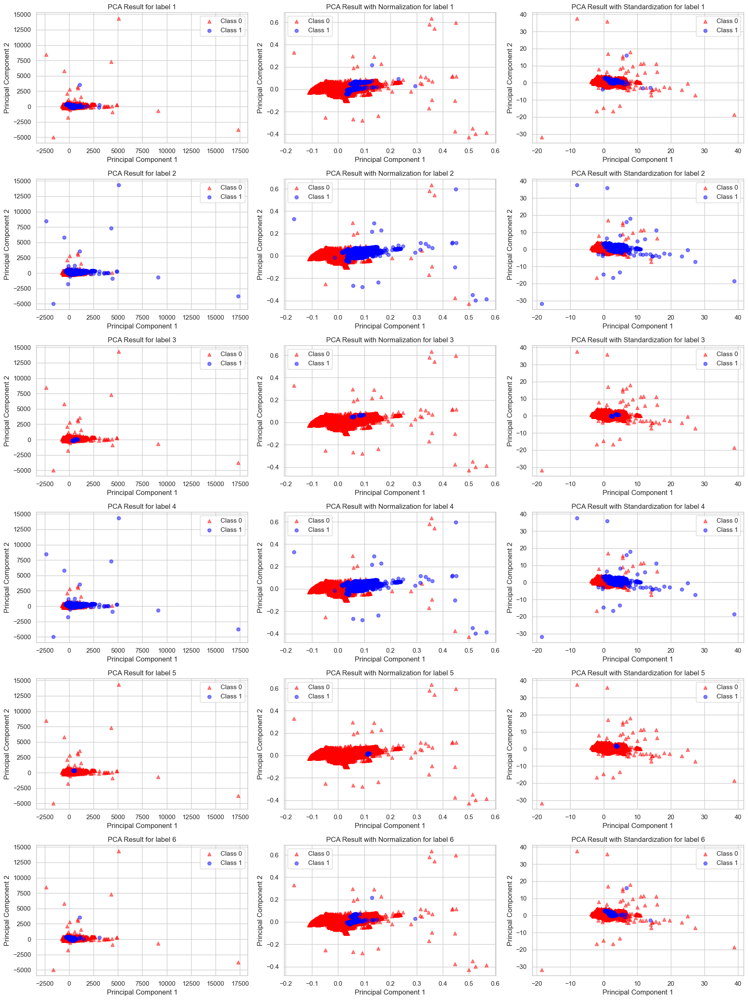

In [15]:
plot_pca(df_features.values,df_data)

In the above analysis, we did not perform data normalization/standardization. Could you try to do that and see if the results change? You can use the follwing code for standardization:

```python
from sklearn.preprocessing import StandardScaler

scaler = StandardScaler()
X_train = scaler.fit_transform(X_train)
```

And this for normalization:

```python
from sklearn.preprocessing import MinMaxScaler

scaler = MinMaxScaler()
X_train = scaler.fit_transform(X_train)
```

Normalization and standardization have been plotted above

We have to remove the outliers before scaling, so I changed the order of the tasks. We also thought it would be simpler to start by smoothing, then removing outliers and normalizing

# Task 2 Data cleaning and preprocessing

## Task 1: Define a strategy to smooth the data.

Explain how do you smooth the data and implement your approach here.

In [16]:
def smooth_data_moving_average(data, window_size):
    """Smooth data by computing moving average."""
    return data.rolling(window=window_size, min_periods=1).mean()

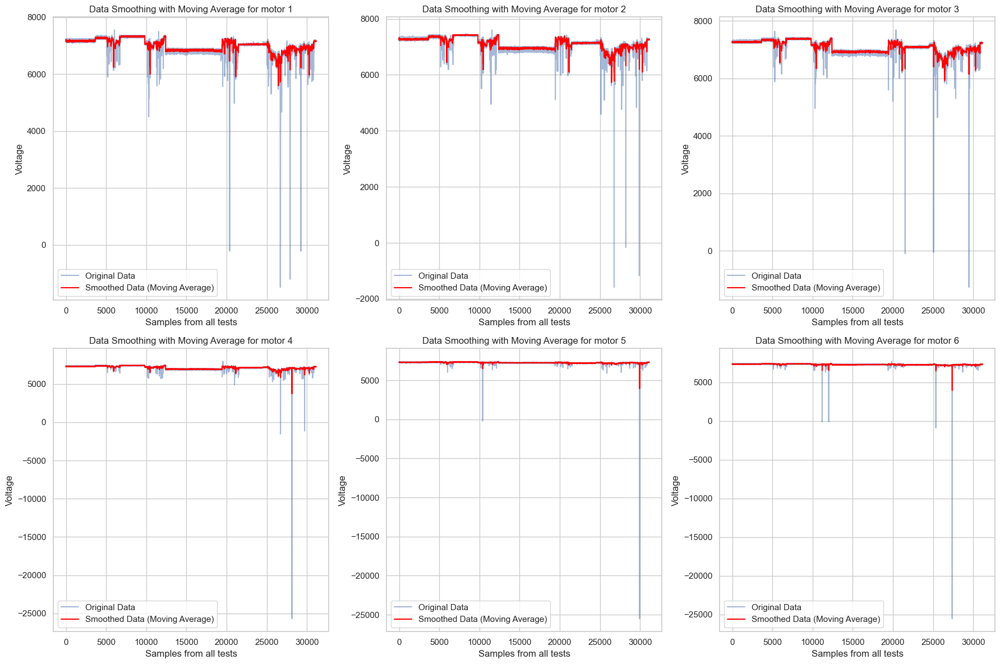

In [17]:
window_size = 10

fig, axs = plt.subplots(2, 3, figsize=(18, 12))

smoothed_data = df_data.copy(deep=True)
smoothed_data.drop(columns=['time','test_condition'], inplace=True)

for i in range(1,7):
    smoothed_data[f'data_motor_{i}_voltage'] = smooth_data_moving_average(df_data[f'data_motor_{i}_voltage'], window_size)

    # Plot the original and smoothed data
    axs[(i-1)//3, (i-1)%3].plot(df_data[f'data_motor_{i}_voltage'], label='Original Data', alpha=0.5)
    axs[(i-1)//3, (i-1)%3].plot(smoothed_data[f'data_motor_{i}_voltage'], label='Smoothed Data (Moving Average)', color='red')
    axs[(i-1)//3, (i-1)%3].set_title(f'Data Smoothing with Moving Average for motor {i}')
    axs[(i-1)//3, (i-1)%3].set_xlabel('Samples from all tests')
    axs[(i-1)//3, (i-1)%3].set_ylabel('Voltage')
    axs[(i-1)//3, (i-1)%3].legend()
plt.tight_layout()
plt.show()

Check the impact of smoothing on linear separability:

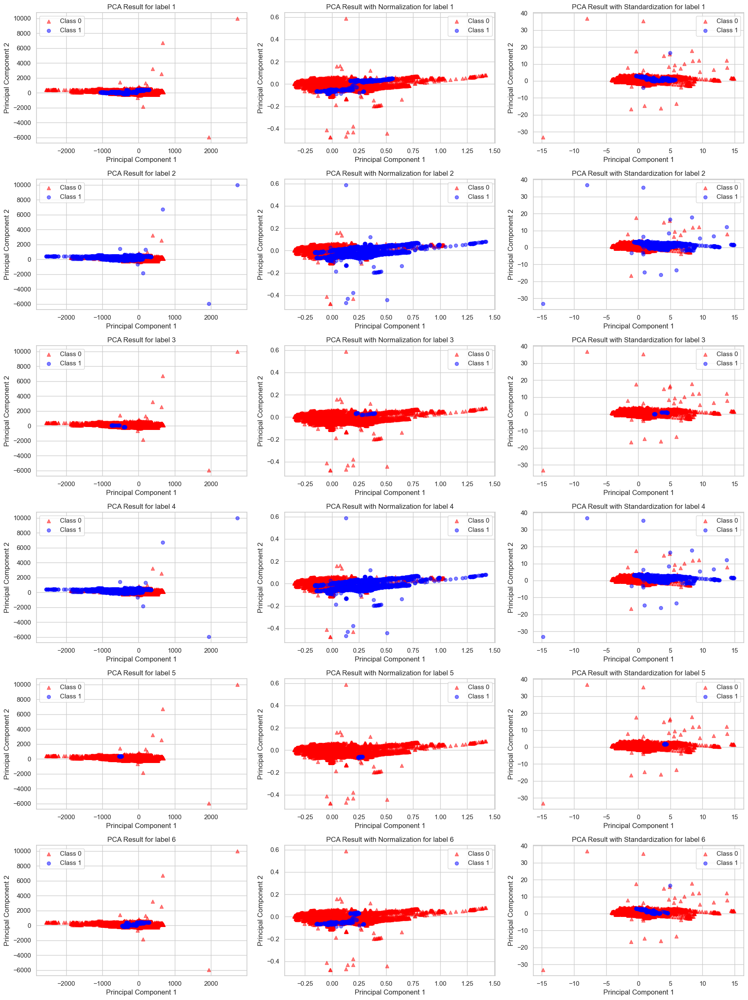

In [18]:
smoothed_features = smoothed_data.drop(columns=label_columns)
plot_pca(smoothed_features.values,smoothed_data)

## Task 2: Define a strategy to remove outliers.

Explain how you remove the outliers and implement your approach here.

In [19]:
def remove_outliers(data, alpha):
        if all(col in data.columns for col in label_columns):
                # If label columns exist, remove them
                data_without_labels = data.drop(columns=label_columns)
        else:
                # If label columns do not exist, keep the original dataframe
                data_without_labels = data.copy(deep = True)
                
        # Interquartile range method
        Q1 = data_without_labels.quantile(0.25, numeric_only=True)
        Q3 = data_without_labels.quantile(0.75, numeric_only=True)
        IQR = Q3 - Q1
        lower_bound = Q1 - alpha * IQR
        upper_bound = Q3 + alpha * IQR
        mask = ~((data_without_labels.lt(lower_bound, axis=1)) | (data_without_labels.gt(upper_bound, axis=1))).any(axis=1)
        return data[mask]

To visualize the impact of removing outliers in the PCA:

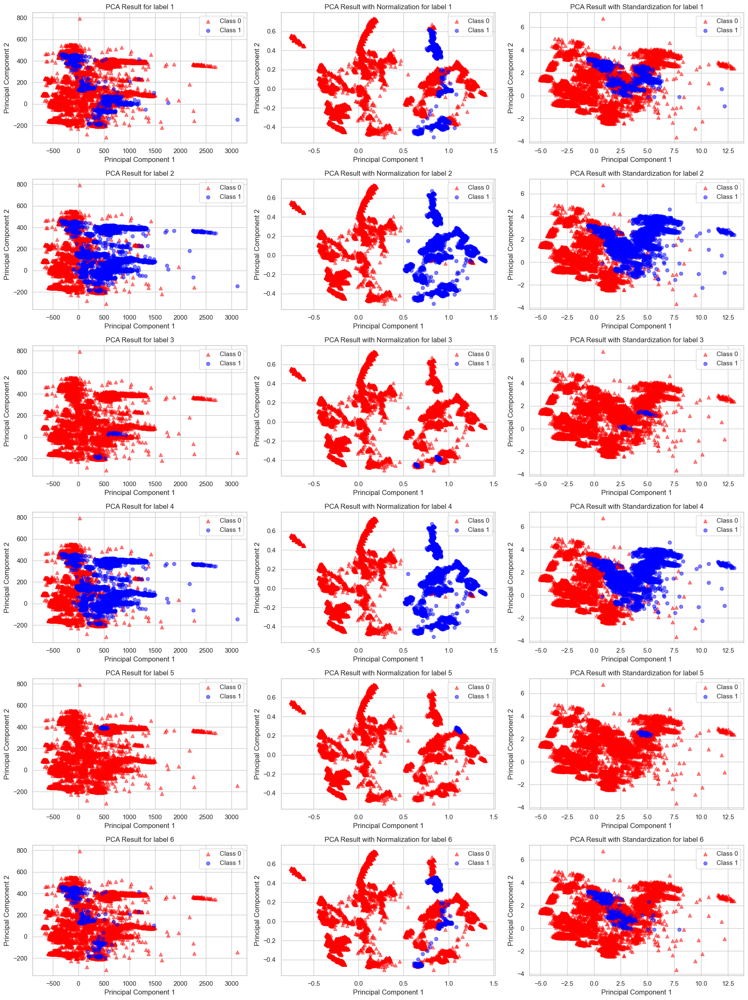

In [20]:
df_no_outliers = remove_outliers(df,10)
no_outliers_features = df_no_outliers.drop(columns=label_columns)
plot_pca(no_outliers_features.values,df_no_outliers )

If we choose alpha = 10, the model for label 2 and for label 4 are linearly separable for the normalization data! For alpha = 8.5, we lose the linear separability of these models and all failure samples for label 5 are removed

To visualize the impact of smooth AND removing outliers in the PCA:

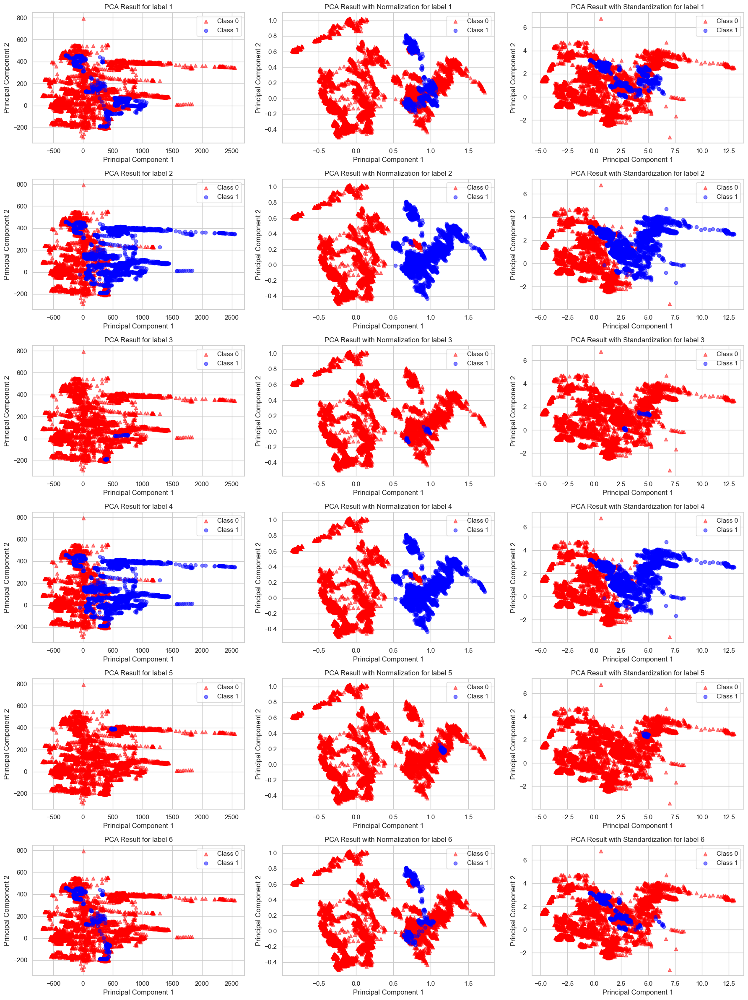

In [21]:
smoothed_data_no_outliers = remove_outliers(smoothed_data,10)
no_outliers_features = smoothed_data_no_outliers.drop(columns=label_columns)
plot_pca(no_outliers_features.values, smoothed_data_no_outliers)

If we choose alpha = 10, the model for label 2 and for label 4 are linearly separable for the normalization data!

Now we can see what the boxplots look like for each feature:

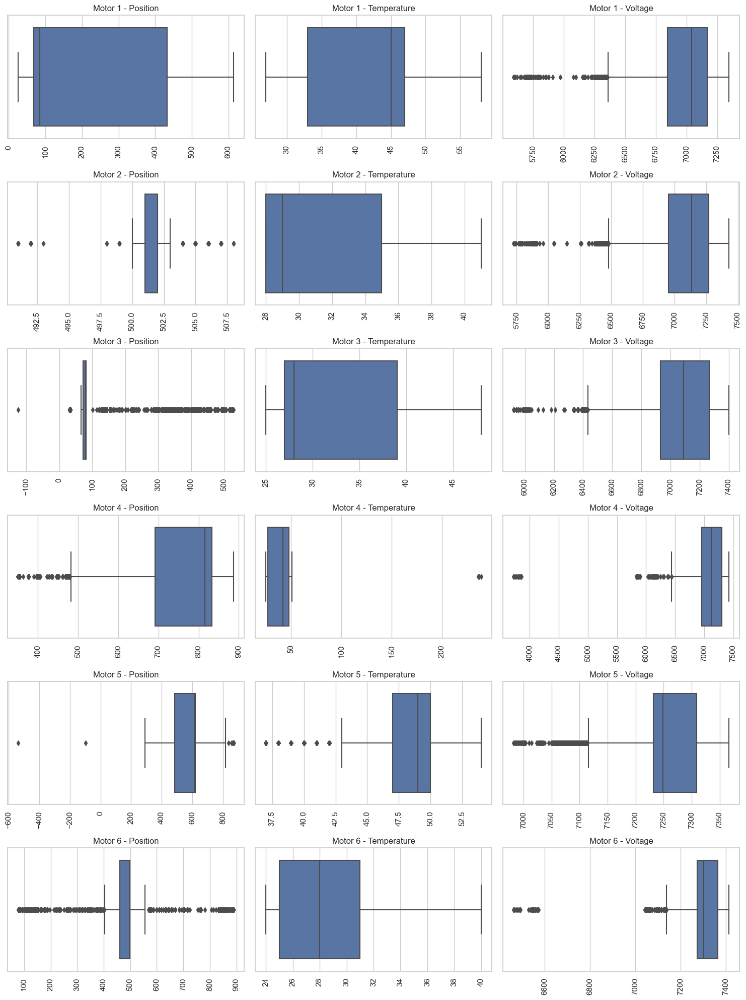

In [22]:
smoothed_data_no_outliers = remove_outliers(smoothed_data,10)

fig, axs = plt.subplots(6, 3, figsize=(15, 20))

for i in range(1, 7):
    for j, feature in enumerate(motor_features):
        data = smoothed_data_no_outliers[f'data_motor_{i}_{feature}']
        sns.boxplot(x=data, ax=axs[i-1, j])
        axs[i-1, j].set_title(f'Motor {i} - {feature.capitalize()}')
        axs[i-1, j].set_xlabel('')
        axs[i-1, j].set_ylabel('')
        axs[i-1, j].tick_params(axis='x', rotation=90)

plt.tight_layout()
plt.show()

### Removing outliers in train and test:

In [23]:
smoothed_features = smoothed_data.drop(columns=label_columns) # When we have time, we should do the smoothing after separating training and testing

X = np.array(smoothed_features)

# It is important to separate training and testing before normalization to avoid data leakage from training to testing in the future application of the machine learning model

#We have 18 candidates for the features, and each model will be applied to a specific motor, so there is a y for each motor
y_dict = {}
y_train_dict = {}
y_test_dict = {}

for i in range(1,7):
    y_dict[f'y_{i}'] = smoothed_data[f'data_motor_{i}_label']
    X_train, X_test, y_train_dict[f'y_{i}'], y_test_dict[f'y_{i}'] = train_test_split(X, y_dict[f'y_{i}'], test_size=0.2, random_state=42)

In [24]:
# Function to calculate percentage of data removed
def calculate_percentage_removed(original_shape, filtered_shape):
    return ((original_shape - filtered_shape) / original_shape) * 100

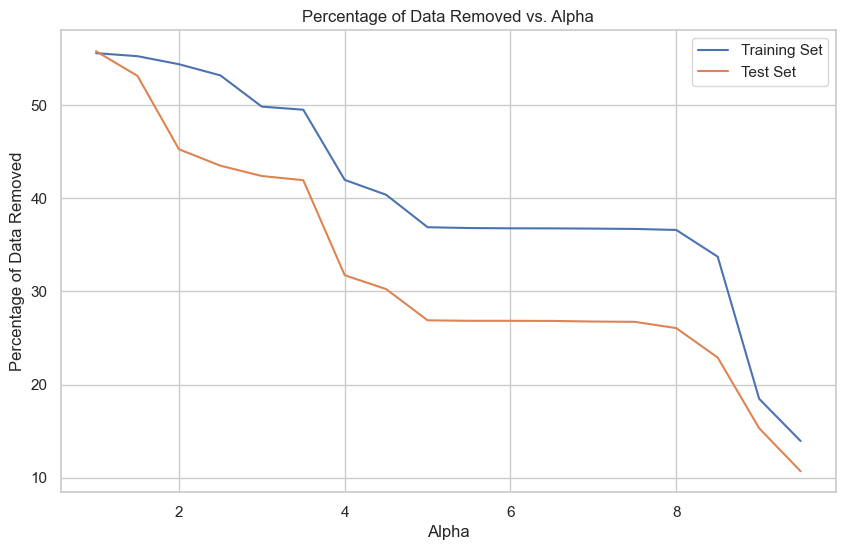

In [25]:
# Define alpha values 
alphas = np.arange(1, 10, 0.5)

percentage_removed_train = []
percentage_removed_test = []

# Calculate percentage removed for each alpha
for alpha in alphas:
    X_train_no_outliers = np.array(remove_outliers(pd.DataFrame(X_train), alpha))
    X_test_no_outliers = np.array(remove_outliers(pd.DataFrame(X_test), alpha))
    percentage_removed_train.append(calculate_percentage_removed(X_train.shape[0], X_train_no_outliers.shape[0]))
    percentage_removed_test.append(calculate_percentage_removed(X_test.shape[0], X_test_no_outliers.shape[0]))

plt.figure(figsize=(10, 6))
plt.plot(alphas, percentage_removed_train, label='Training Set')
plt.plot(alphas, percentage_removed_test, label='Test Set')
plt.xlabel('Alpha')
plt.ylabel('Percentage of Data Removed')
plt.title('Percentage of Data Removed vs. Alpha')
plt.legend()
plt.grid(True)
plt.show()

With alpha < 5, we lose a lot of important data for classification. For alpha >= 9, the outliers for the temperature of motor 4 seem not to have been removed (boxplot). However, for alpha = 8.5, and all failure samples for label 5 are removed, hence we will choose alpha = 10. Practically speaking, the right thing to do in the future is to test the alpha according to the performance of the machine learning model. We can also test leaving alpha = 10 for the label 5 model and test 8.5 for the other models

In [26]:
X_train_no_outliers = np.array(remove_outliers(pd.DataFrame(X_train), 10))
X_test_no_outliers = np.array(remove_outliers(pd.DataFrame(X_test), 10))


## Task 2: Normalize or Standardize the dataset..
Define your strategy to normalize the dataset and implement the data. Please pay attention to the difference between fit_transform(), fit(), and transform().

.transform() transform the features by subtracting the mean and dividing by the variance

.fit() calculate the mean and variance 

.fit_transform() : .fit() + .transform()

In [27]:
scaler = MinMaxScaler()
X_train_normalized = scaler.fit_transform(X_train_no_outliers)
X_test_normalized = scaler.transform(X_test_no_outliers) # only transform : we don't want to bias the model with information from the test data.

# Task 3 Feature engineering

## Task 1: Use violin plot to explore the significance of each feature.

In [28]:
smoothed_data_no_outliers = remove_outliers(smoothed_data, 10) 
scaler = MinMaxScaler()
smoothed_data_normalized = pd.DataFrame(scaler.fit_transform(np.array(smoothed_data_no_outliers)), columns=smoothed_data.columns)

In [29]:
def plot_violin(label):
    #first 9 features and label 1
    data_violin = smoothed_data_normalized.drop(columns=label_columns)
    data_violin = pd.concat([data_violin.iloc[:,0:9], smoothed_data_normalized[f'data_motor_{label}_label']], axis=1)
    data_violin = pd.melt(data_violin, id_vars=f'data_motor_{label}_label', var_name="features", value_name='value')

    plt.figure(figsize=(20,20))
    plt.subplot(211)
    sns.violinplot(x="features", y="value", hue=f'data_motor_{label}_label', data=data_violin, split=True, inner="quart")
    plt.xticks(rotation=90)

    #Last 9 features and label 1
    data_violin = smoothed_data_normalized.drop(columns=label_columns)
    data_violin = pd.concat([data_violin.iloc[:,9:17], smoothed_data_normalized[f'data_motor_{label}_label']], axis=1)
    data_violin = pd.melt(data_violin, id_vars=f'data_motor_{label}_label', var_name="features", value_name='value')

    plt.subplot(212)
    sns.violinplot(x="features", y="value", hue=f'data_motor_{label}_label', data=data_violin, split=True, inner="quart")
    plt.xticks(rotation=90)

    plt.tight_layout()  
    plt.show()

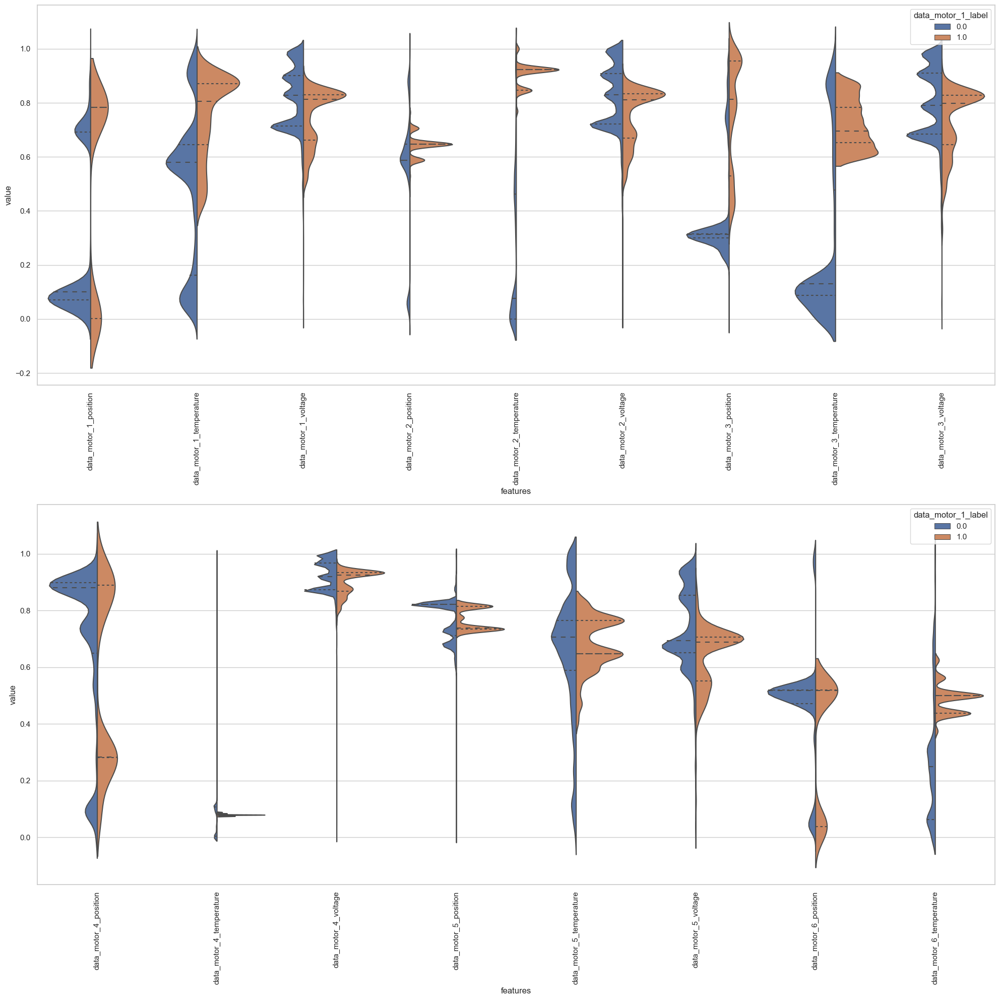

In [30]:
#first label
plot_violin(1)

The median of the fault and normal data for data_motor_3_temperature and data_motor_3_position seem separate, which makes these features good for classification. However, the median of the fault and normal data for data_motor_6_position is not separated, which indicates that it is a candidate feature to be removed for classification

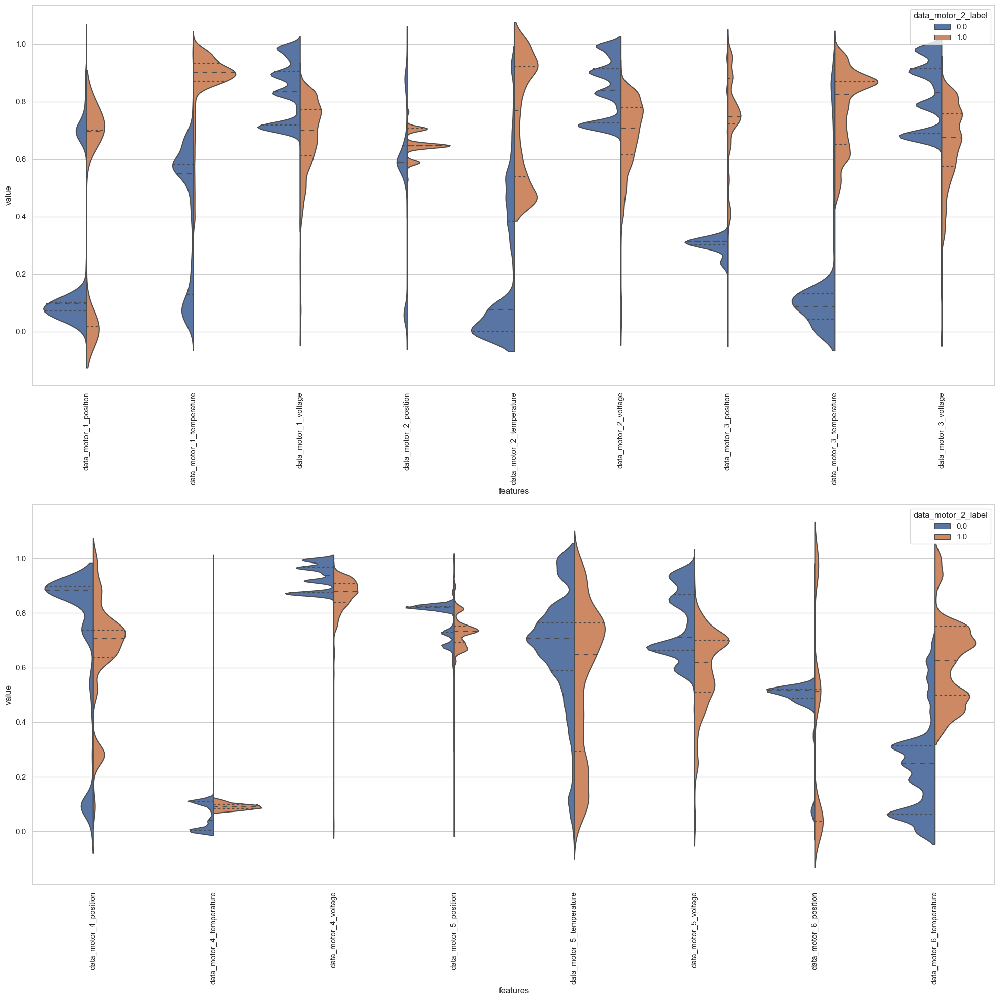

In [31]:
#label 2
plot_violin(2)

the median of the fault and normal data for data_motor_5_temperature is not separated, which indicates that it is a candidate feature to be removed for classification

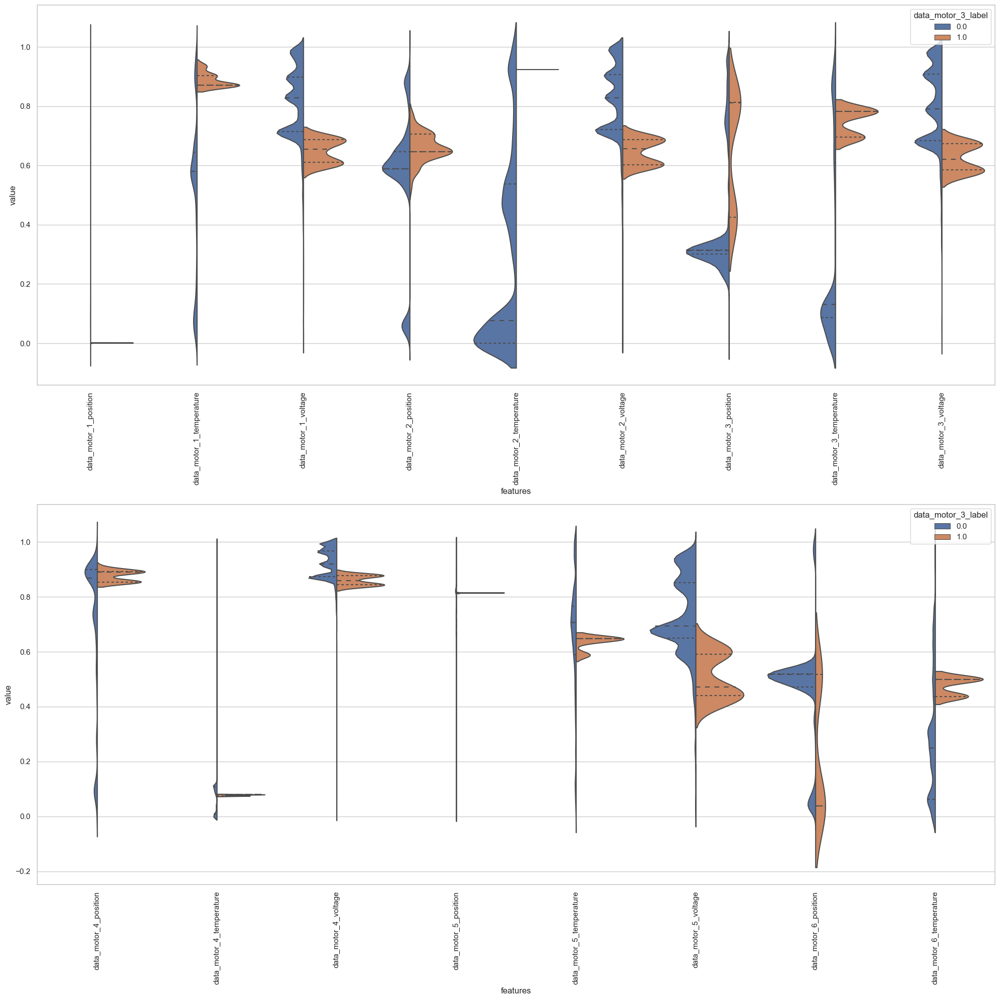

In [32]:
#label 3
plot_violin(3)

No candidate features to be removed for classification based on this criterion

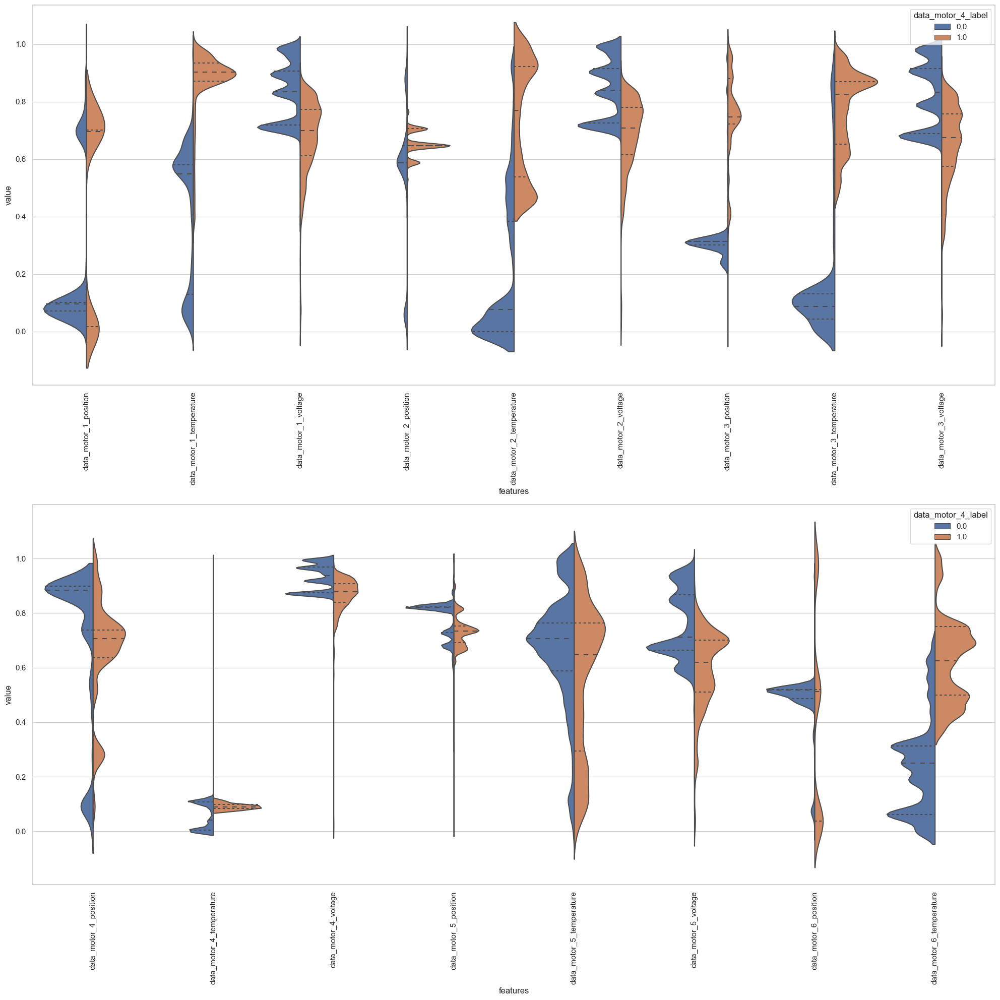

In [33]:
#label 4
plot_violin(4)

Candidate features to be removed for classification : data_motor_5_temperature

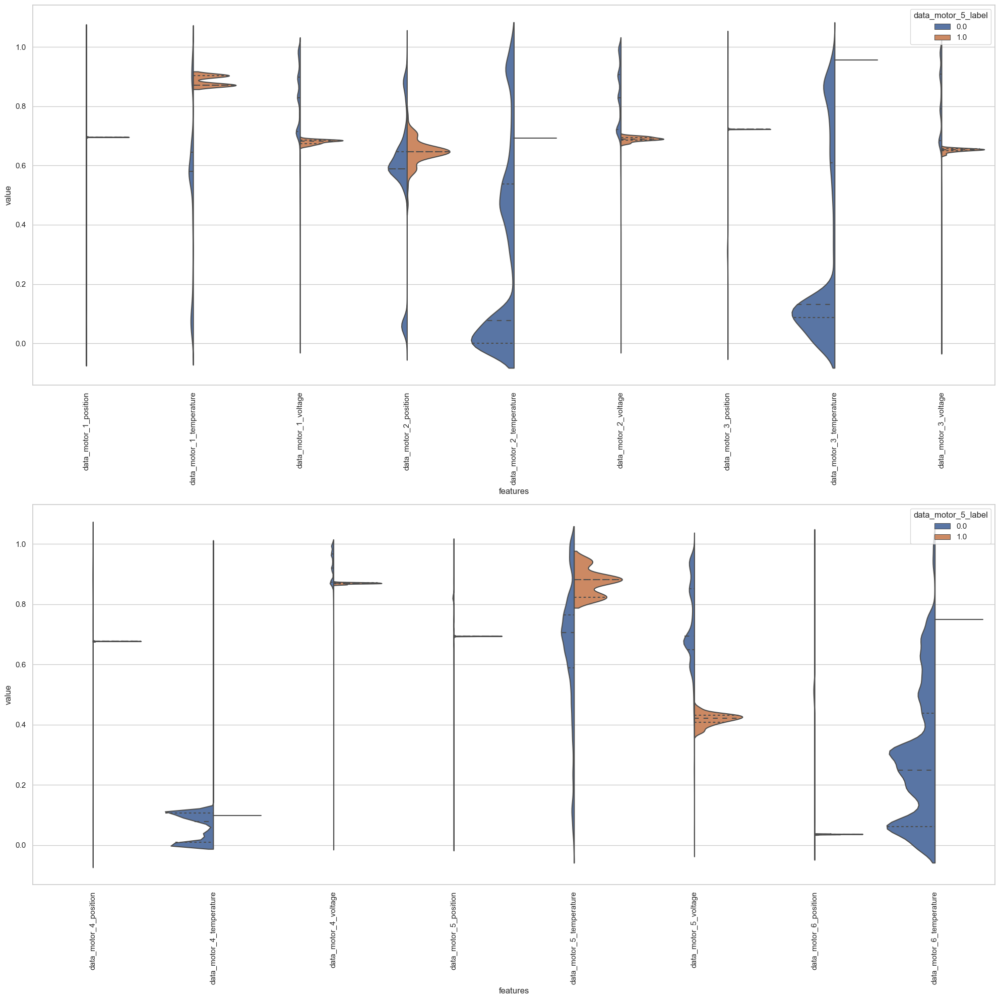

In [34]:
#label 5
plot_violin(5)

No candidate features to be removed for classification based on this criterion

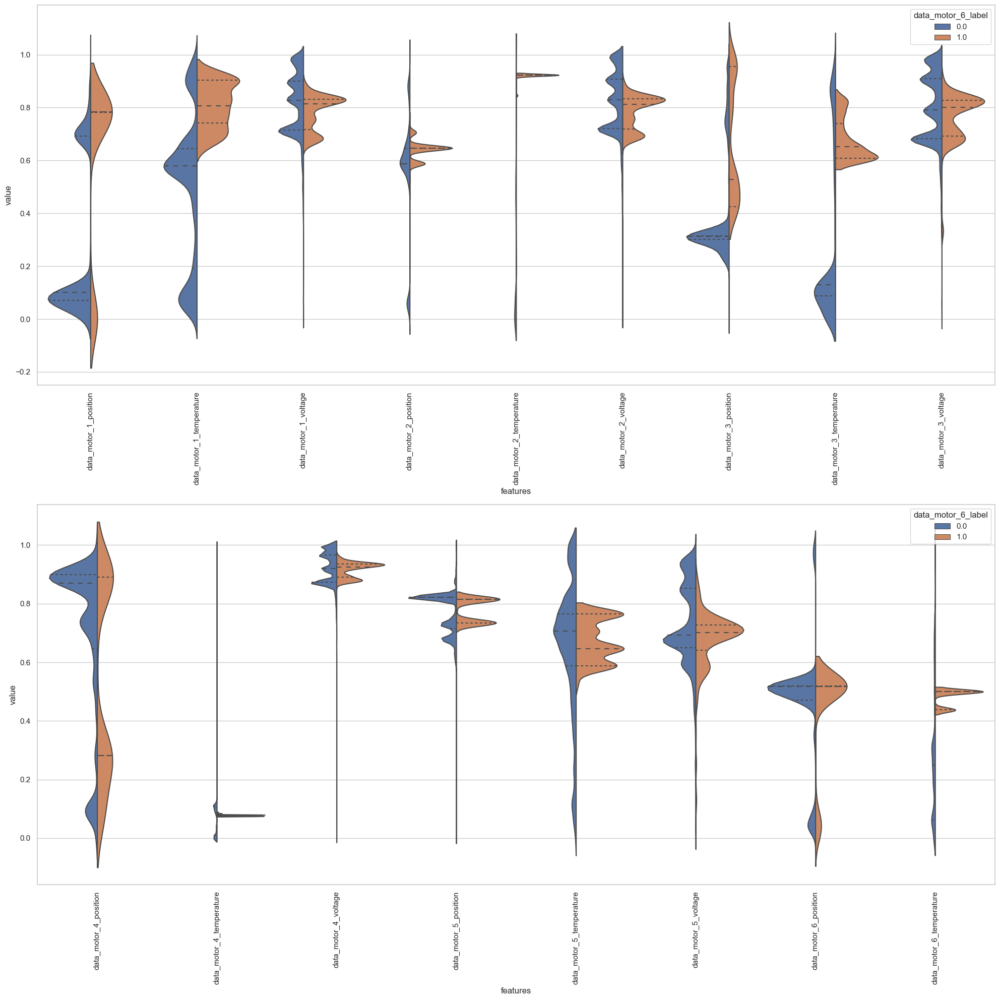

In [35]:
#label 6
plot_violin(6)

Candidate features to be removed for classification : data_motor_6_position

## Task 2: Use correlation coefficient matrix to explore the correlation among the features.

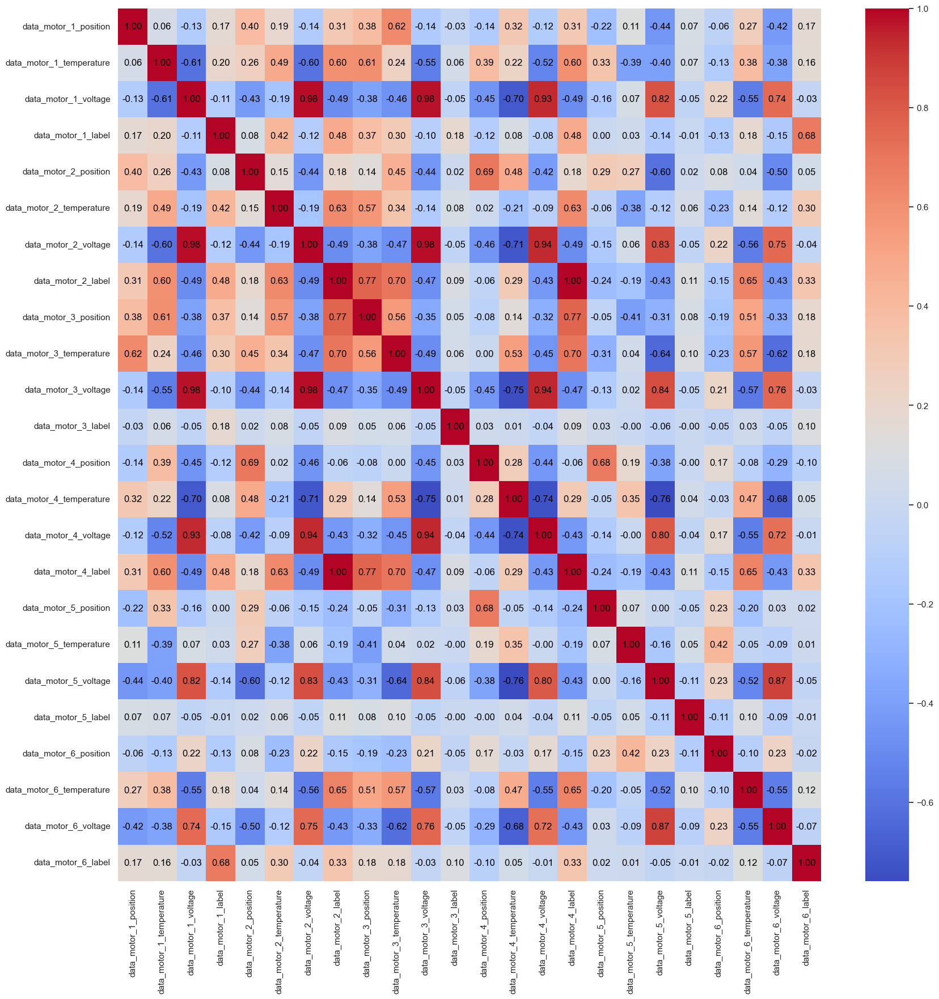

In [36]:
# Compute correlation matrix
correlation_matrix = smoothed_data_normalized.corr()

# Plot correlation matrix using seaborn
plt.figure(figsize=(20, 20))  # Adjust width and height as needed
sns.heatmap(correlation_matrix, cmap='coolwarm', fmt=".2f")

for i in range(len(correlation_matrix)):
    for j in range(len(correlation_matrix)):
        plt.text(j + 0.5, i + 0.5, '{:.2f}'.format(correlation_matrix.iloc[i, j]), ha='center', va='center', color='black')


All 6 voltages are highly correlated with each other, so we should keep only the first voltage in all classifications:

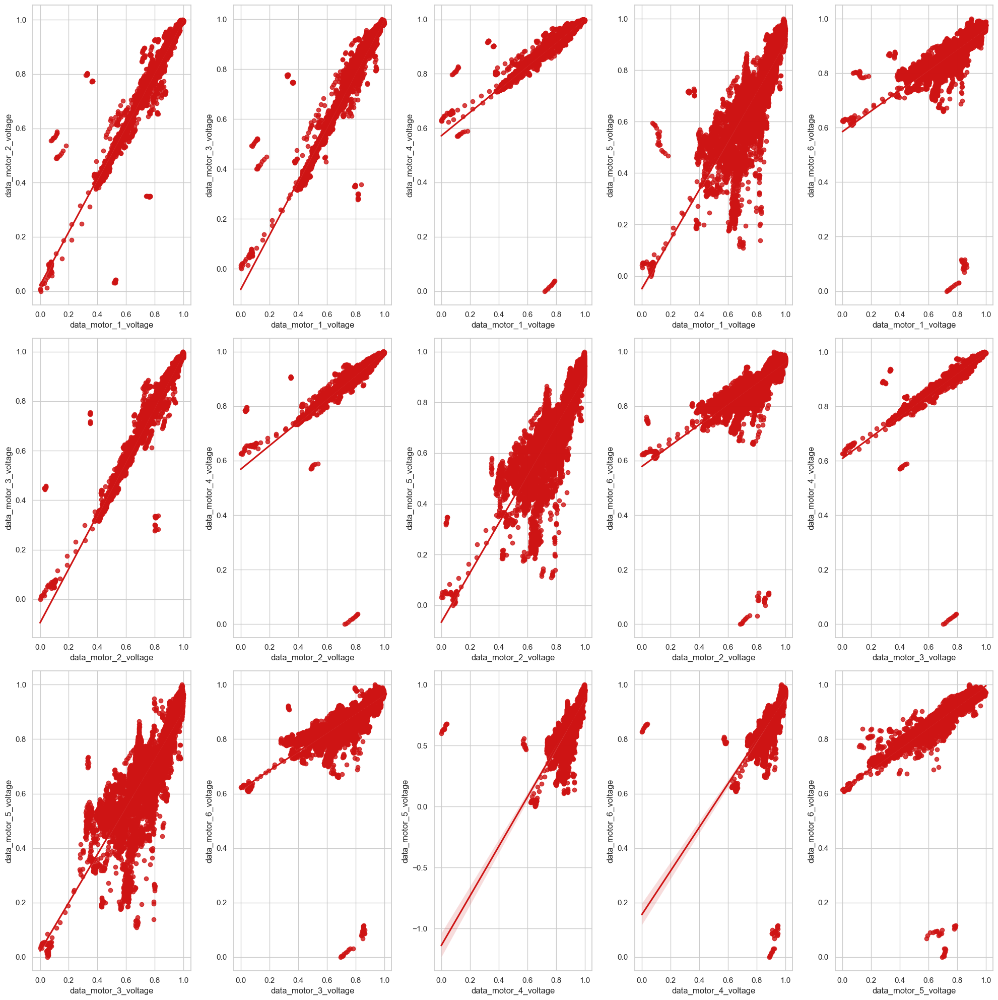

In [40]:
num_rows = 3
num_cols = 5

fig, axes = plt.subplots(num_rows, num_cols, figsize=(20, 20))

subplot_index = 0
for i in range(1, 7):
    for j in range(i+1, 7):
        x_voltage = f'data_motor_{i}_voltage'
        y_voltage = f'data_motor_{j}_voltage'
        
        row = subplot_index // num_cols
        col = subplot_index % num_cols
        
        sns.regplot(
            x=x_voltage,
            y=y_voltage,
            data=smoothed_data_normalized,
            color="#ce1414",
            ax=axes[row, col]
        )
        
        subplot_index += 1
        if subplot_index >= num_rows * num_cols:
            break
    else:
        continue
    break

plt.tight_layout()
plt.show()

## Conclusion of feature engineering

**Write your conclusion of feature engineering here.** For example, which features are most relevant? Which features are not relevant? Which features are redundant? Which features are irrelevant? Eventually, what are your decisions regarding which features to be used?

- All 6 voltages are highly correlated with each other, so we should keep only the first voltage in all classifications

- data_motor_3_position is highly correlated with data_motor_4_label and with data_motor_2_label, then we shoul keep the data_motor_3_position in the 2th and in the 4th classification

- data_motor_1_temperature and data_motor_3_temperature are correlated with data_motor_4_label, then we should keep them in the 4th classification

- The median of the fault and normal data for data_motor_6_position is not separated, which indicates that we should removed it for 1th classification

- The median of the fault and normal data for data_motor_5_temperature is not separated, which indicates that we should removed it for 2th and 4th classification

- The median of the fault and normal data for data_motor_6_position is not separated, which indicates that we should removed it for 6th classification 

## Further analysis

Implement model for label 1

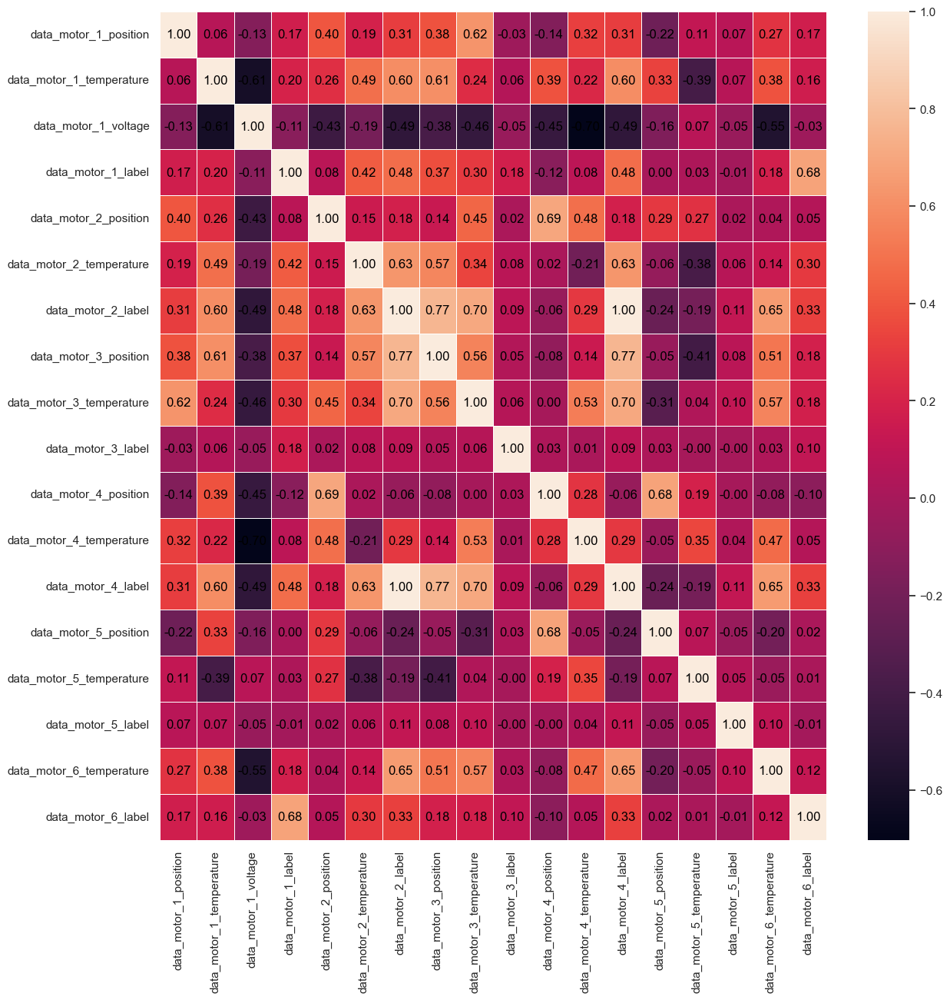

In [ ]:
drop_list1_label1 = ['data_motor_2_voltage','data_motor_3_voltage','data_motor_4_voltage','data_motor_5_voltage','data_motor_6_voltage','data_motor_6_position']
x_1 = smoothed_data_normalized.drop(drop_list1_label1 ,axis = 1 )         
f,ax = plt.subplots(figsize=(14, 14))

sns.heatmap(x_1.corr(), linewidths=.5, fmt= '.1f',ax=ax)
for i in range(len(x_1.corr())):
    for j in range(len(x_1.corr())):
        plt.text(j + 0.5, i + 0.5, '{:.2f}'.format(x_1.corr().iloc[i, j]), ha='center', va='center', color='black')

Random under-sampling (We must keep in mind that with this method we lose a lot of our data):

In [ ]:
# Class count
count_class_0, count_class_1 = smoothed_data['data_motor_1_label'].value_counts()

# Divide by class
smoothed_data_Normal = smoothed_data[smoothed_data['data_motor_1_label'] == 0]
smoothed_data_Failure = smoothed_data[smoothed_data['data_motor_1_label'] == 1]

smoothed_data_Normal_under = smoothed_data_Normal.sample(count_class_1)
smoothed_data_under = pd.concat([smoothed_data_Normal_under, smoothed_data_Failure], axis=0)

print(smoothed_data_under['data_motor_1_label'].value_counts())

data_motor_1_label
0    1292
1    1292
Name: count, dtype: int64


In [ ]:
print(smoothed_data['data_motor_1_label'].value_counts())

data_motor_1_label
0    29843
1     1292
Name: count, dtype: int64


Although separating training and testing before preprocessing is correct, it has some problems removing outliers. Because if we remove the outliers from X_train and X_test separately, then y_train will have more rows than X_train. The intermediate solution I found was as follows:

Accuracy is:  0.9987080103359173


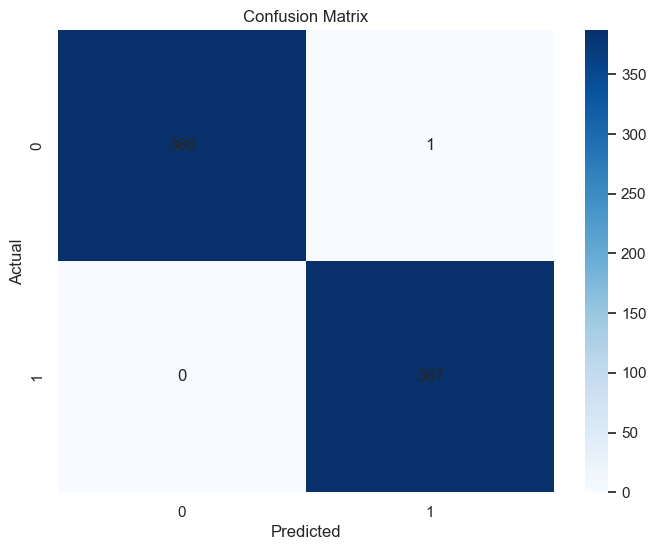

              precision    recall  f1-score   support

           0       1.00      1.00      1.00       387
           1       1.00      1.00      1.00       387

    accuracy                           1.00       774
   macro avg       1.00      1.00      1.00       774
weighted avg       1.00      1.00      1.00       774



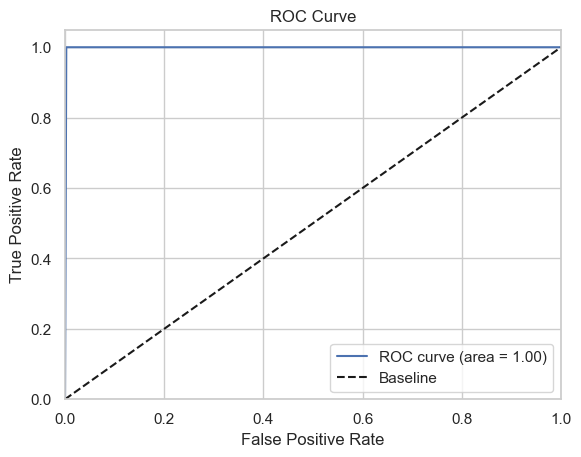

In [ ]:
def remove_outliers2(data, alpha):
    if all(col in data.columns for col in label_columns):
        # If label columns exist, remove them
        data_without_labels = data.drop(columns=label_columns)
    else:
        # If label columns do not exist, keep the original dataframe
        data_without_labels = data.copy(deep=True)
    
    # Interquartile range method
    Q1 = data_without_labels.quantile(0.25, numeric_only=True)
    Q3 = data_without_labels.quantile(0.75, numeric_only=True)
    IQR = Q3 - Q1
    lower_bound = Q1 - alpha * IQR
    upper_bound = Q3 + alpha * IQR
    mask = ~((data_without_labels.lt(lower_bound, axis=1)) | (data_without_labels.gt(upper_bound, axis=1))).any(axis=1)
    
    # Return indices of outliers removed
    removed_indices = data.index[~mask]
    
    return data[mask], removed_indices

drop_list1_label1 = ['data_motor_2_voltage', 'data_motor_3_voltage', 'data_motor_4_voltage', 
                     'data_motor_5_voltage', 'data_motor_6_voltage', 'data_motor_6_position']

smoothed_features = smoothed_data_under.drop(columns=label_columns)
smoothed_selected_features = smoothed_features.drop(columns=drop_list1_label1)

X = np.array(smoothed_selected_features)

y_dict = {}
y_train_dict = {}
y_test_dict = {}

for i in range(1, 7):
    y_dict[f'y_{i}'] = smoothed_data_under[f'data_motor_{i}_label']
    X_train, X_test, y_train_dict[f'y_{i}'], y_test_dict[f'y_{i}'] = train_test_split(X, y_dict[f'y_{i}'], test_size=0.3, random_state=42)
    
# X_train_normalized and y_train_dict['y_1'] should have the same number of lines
X_train_no_outliers, removed_indices_train = remove_outliers2(pd.DataFrame(X_train), 10)
X_test_no_outliers, removed_indices_test = remove_outliers2(pd.DataFrame(X_test), 10)

for i in range(1, 7):
    y_train_dict[f'y_{i}'] = np.delete(y_train_dict[f'y_{i}'], removed_indices_train, axis=0)
    y_test_dict[f'y_{i}'] = np.delete(y_test_dict[f'y_{i}'], removed_indices_test, axis=0)

# Normalization
scaler = MinMaxScaler()
X_train_normalized = scaler.fit_transform(X_train_no_outliers)
X_test_normalized = scaler.transform(X_test_no_outliers)

clf_rf_label1 = RandomForestClassifier(random_state=43)
clr_rf_label1 = clf_rf_label1.fit(X_train_normalized, y_train_dict['y_1'])

ac = accuracy_score(y_test_dict['y_1'], clf_rf_label1.predict(X_test_normalized))
print('Accuracy is: ', ac)
cm = confusion_matrix(y_test_dict['y_1'], clf_rf_label1.predict(X_test_normalized))

plt.figure(figsize=(8, 6))

for i in range(len(cm)):
    for j in range(len(cm[i])):
        plt.text(j + 0.5, i + 0.5, str(cm[i][j]), ha='center', va='center')

sns.heatmap(cm, annot=False, cmap="Blues", cbar=True)
plt.xlabel('Predicted')
plt.ylabel('Actual')
plt.title('Confusion Matrix')
plt.show()

print(classification_report(y_test_dict['y_1'], clf_rf_label1.predict(X_test_normalized)))

fpr, tpr, thresholds = roc_curve(y_test_dict['y_1'], clf_rf_label1.predict(X_test_normalized)) 
roc_auc = auc(fpr, tpr)
# Plot the ROC curve
plt.figure()  
plt.plot(fpr, tpr, label='ROC curve (area = %0.2f)' % roc_auc)
plt.plot([0, 1], [0, 1], 'k--', label='Baseline')
plt.xlim([0.0, 1.0])
plt.ylim([0.0, 1.05])
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('ROC Curve')
plt.legend()
plt.show()

Univariate feature selection 

In [ ]:
# find best scored 5 features
select_feature = SelectKBest(chi2, k=5).fit(X_train_normalized, y_train_dict['y_1'])

best_5_features = pd.DataFrame({'Feature': smoothed_selected_features.columns, 'Score': select_feature.scores_})

best_5_features_sorted = best_5_features.sort_values(by='Score', ascending=False)

print("Best 5 features :")
print(best_5_features_sorted .head(5))

Best 5 features :
                    Feature       Score
4  data_motor_2_temperature  325.626322
5     data_motor_3_position  236.674642
6  data_motor_3_temperature  194.001786
0     data_motor_1_position   81.119781
1  data_motor_1_temperature   55.028849


Compare with separate training and testing before pre-processing:

Accuracy is:  0.9987080103359173


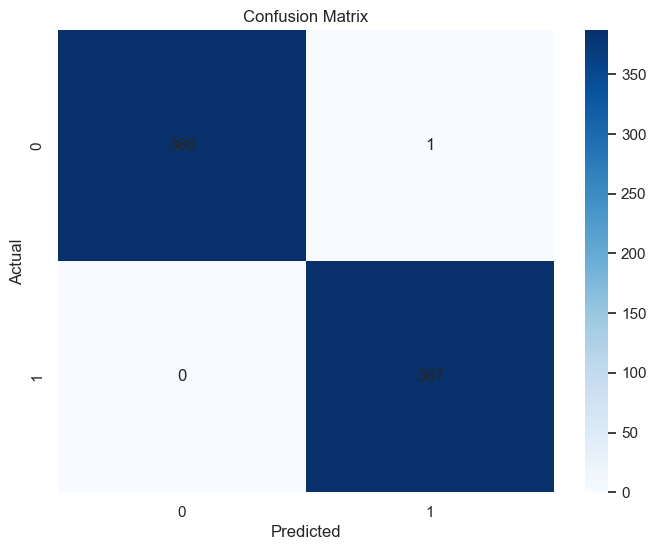

              precision    recall  f1-score   support

           0       1.00      1.00      1.00       387
           1       1.00      1.00      1.00       387

    accuracy                           1.00       774
   macro avg       1.00      1.00      1.00       774
weighted avg       1.00      1.00      1.00       774



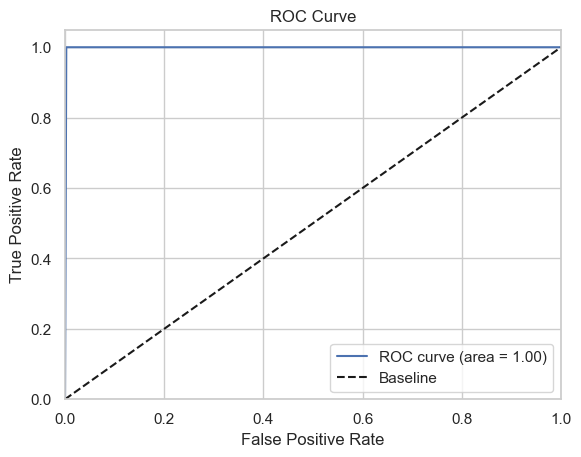

In [ ]:
## Remove outliers
smoothed_no_outliers = remove_outliers(smoothed_data,10)

## Random Undersampling

# Class count
count_class_0, count_class_1 = smoothed_no_outliers['data_motor_1_label'].value_counts()

# Divide by class
smoothed_data_Normal = smoothed_no_outliers[smoothed_no_outliers['data_motor_1_label'] == 0]
smoothed_data_Failure = smoothed_no_outliers[smoothed_no_outliers['data_motor_1_label'] == 1]

smoothed_data_Normal_under = smoothed_data_Normal.sample(count_class_1)
smoothed_data_under = pd.concat([smoothed_data_Normal_under, smoothed_data_Failure], axis=0)

## Select features
drop_list1_label1 = ['data_motor_2_voltage', 'data_motor_3_voltage', 'data_motor_4_voltage', 
                     'data_motor_5_voltage', 'data_motor_6_voltage', 'data_motor_6_position']

smoothed_features = smoothed_data_under.drop(columns=label_columns)
smoothed_selected_features = smoothed_features.drop(columns=drop_list1_label1)

X1 = np.array(smoothed_selected_features)

# Normalization
scaler = MinMaxScaler()
X1_normalized = scaler.fit_transform(X1)

y_dict = {}
y_train_dict = {}
y_test_dict = {}

for i in range(1, 7):
    y_dict[f'y_{i}'] = smoothed_data_under[f'data_motor_{i}_label']
    X_train, X_test, y_train_dict[f'y_{i}'], y_test_dict[f'y_{i}'] = train_test_split(X1_normalized, y_dict[f'y_{i}'], test_size=0.3, random_state=42)

clf_rf_label1 = RandomForestClassifier(random_state=43)
clr_rf_label1 = clf_rf_label1.fit(X_train, y_train_dict['y_1'])

ac = accuracy_score(y_test_dict['y_1'], clf_rf_label1.predict(X_test))
print('Accuracy is: ', ac)
cm = confusion_matrix(y_test_dict['y_1'], clf_rf_label1.predict(X_test))

plt.figure(figsize=(8, 6))

for i in range(len(cm)):
    for j in range(len(cm[i])):
        plt.text(j + 0.5, i + 0.5, str(cm[i][j]), ha='center', va='center')

sns.heatmap(cm, annot=False, cmap="Blues", cbar=True)
plt.xlabel('Predicted')
plt.ylabel('Actual')
plt.title('Confusion Matrix')
plt.show()

print(classification_report(y_test_dict['y_1'], clf_rf_label1.predict(X_test)))

fpr, tpr, thresholds = roc_curve(y_test_dict['y_1'], clf_rf_label1.predict(X_test)) 
roc_auc = auc(fpr, tpr)
# Plot the ROC curve
plt.figure()  
plt.plot(fpr, tpr, label='ROC curve (area = %0.2f)' % roc_auc)
plt.plot([0, 1], [0, 1], 'k--', label='Baseline')
plt.xlim([0.0, 1.0])
plt.ylim([0.0, 1.05])
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('ROC Curve')
plt.legend()
plt.show()